In [83]:
import numpy as np
import matplotlib.pyplot as plt
import cv2 as cv
import os
from skimage import data, io, filters, feature, color
from skimage.measure import find_contours, approximate_polygon, subdivide_polygon
from skimage import img_as_ubyte
from scipy import ndimage as ndi
from PIL import Image

#2
csvFile = open("GTI770_label_data_set.csv", "r")
countTotal = 0
countSmooth = 0
countSpiral = 0
nbImages = 10
img_h = 424
img_w = 424
crop_value = 200

X = np.zeros((nbImages, 3, img_h, img_w),dtype=np.uint8) # matrice X de la forme (nombre d'image, nombre de canaux(RGB), hauteur, largeur)
Y = np.zeros((nbImages, 1), 'U6')     # matrice Y de la forme (nombre d'image, la classe)

def prepareImg(imagePath, countTotal):
    img = cv.imread(imagePath)
    img = img.reshape(3, img_h, img_w)
    X[countTotal] = img        # ajouter l'image dans la matrice X
    Y[countTotal] = imageClass # ajouter sa classe dans la matrice Y
    #print(countTotal, ": preparing "+imagePath)
        

for i in csvFile:
    imageId, imageClass = i.split(',')
    imageClass = imageClass[0:6]
    if imageId != "id":
        imagePath = './images_training/' + imageId + '.jpg'
        
        if imageClass == "smooth" : # si la classe de l'image est 'smooth'
            if countSmooth == nbImages/2 :  # s'il y a 50 image de cette classe
                continue            # passe a la prochaine image
            countSmooth += 1
        elif imageClass == "spiral" :
            if countSpiral == nbImages/2 :
                continue
            countSpiral += 1
        else :
            continue
        if not os.path.exists(imagePath):
            continue
        #
        
        #img = simple_threshold(img, threshold=10)
        prepareImg(imagePath, countTotal)
        countTotal += 1
   
        if countTotal == nbImages: # arrete a nbImages images totales (50 de chaque classe)
            print("smooth", countSmooth)
            print("spiral", countSpiral)
            break
            


smooth 5
spiral 5


In [13]:
def cropImages(matrix, crop_val):
    len = matrix.shape[0]
    print("cropping",len,"images to",crop_val)
    X_train_crop = np.zeros((len, 3, crop_val, crop_val), dtype=np.uint8)
    for i in range(0,len):
        image = matrix[i].reshape(img_h, img_w, 3)
        image = image[424 // 2 - crop_val // 2 : 424 // 2 + crop_val // 2, 424 // 2 - crop_val // 2 : 424 // 2 + crop_val // 2] # garder 25 de chaque cote depuis le milieu, pour chaque axe
        image = image.reshape(3, crop_val, crop_val)
        X_train_crop[i] = image
    return X_train_crop

x_cropped = cropImages(X, crop_value)

cropping 100 images to 200


len 100
image 1
133 contours
8 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6


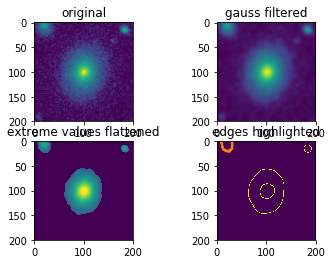

corners 9
65 contours
4 angles
angle 0
angle 1
angle 2


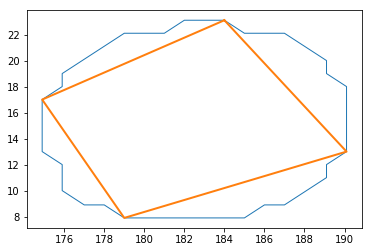

corners 5
57 contours
4 angles
angle 0
angle 1
angle 2


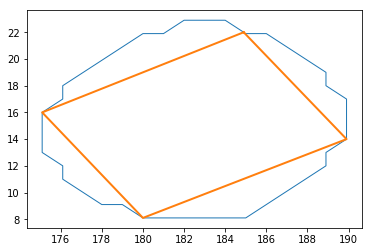

corners 5
329 contours
11 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9


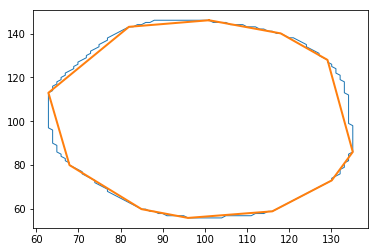

corners 12
321 contours
12 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10


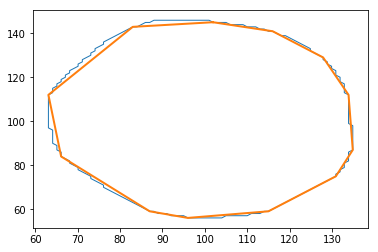

corners 13
127 contours
8 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6


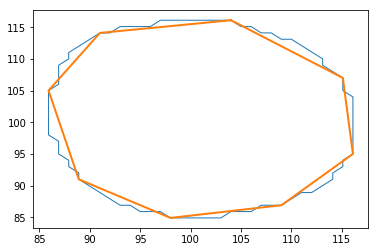

corners 9
119 contours
7 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5


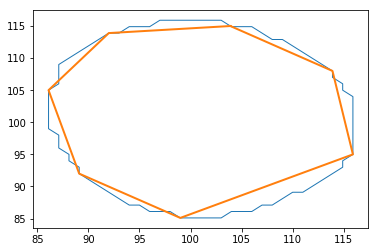

corners 8
image 2
539 contours
21 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10
angle 11
angle 12
angle 13
angle 14
angle 15
angle 16
angle 17
angle 18
angle 19


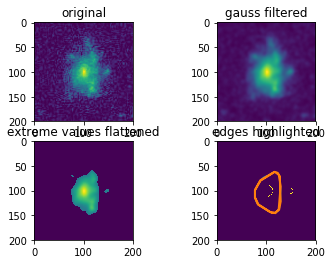

corners 22
91 contours
4 angles
angle 0
angle 1
angle 2


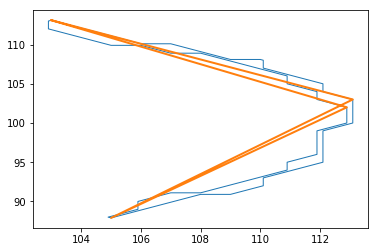

corners 5
83 contours
6 angles
angle 0
angle 1
angle 2
angle 3
angle 4


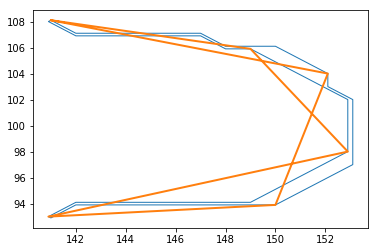

corners 7
image 3
351 contours
10 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8


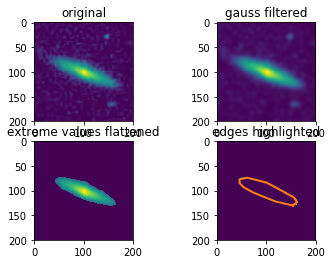

corners 11
341 contours
10 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8


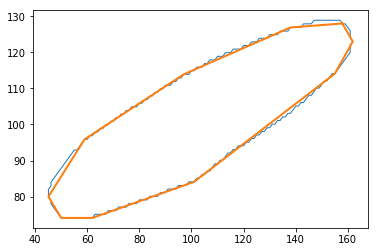

corners 11
image 4
391 contours
16 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10
angle 11
angle 12
angle 13
angle 14


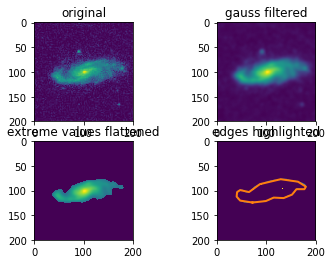

corners 17
381 contours
16 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10
angle 11
angle 12
angle 13
angle 14


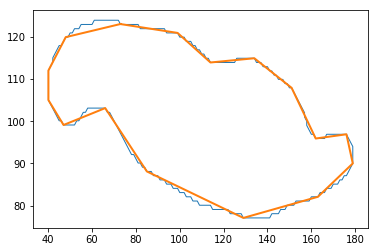

corners 17
image 5
67 contours
4 angles
angle 0
angle 1
angle 2


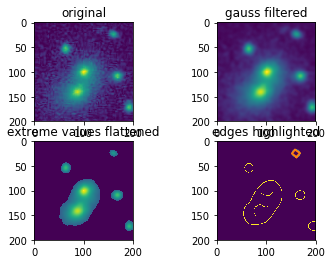

corners 5
59 contours
4 angles
angle 0
angle 1
angle 2


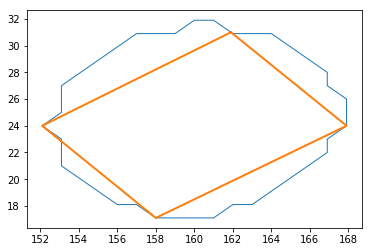

corners 5
75 contours
5 angles
angle 0
angle 1
angle 2
angle 3


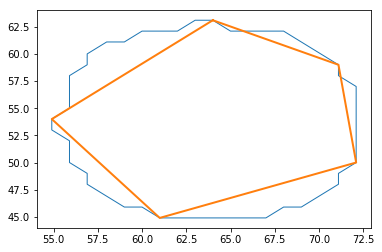

corners 6
67 contours
5 angles
angle 0
angle 1
angle 2
angle 3


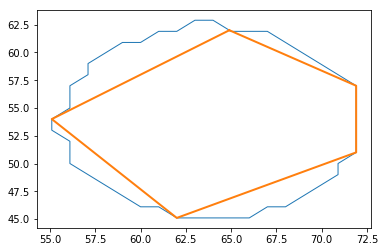

corners 6
339 contours
11 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9


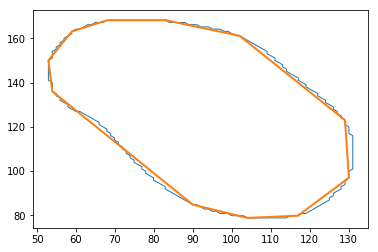

corners 12
331 contours
10 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8


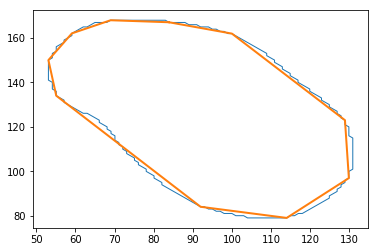

corners 11
61 contours
5 angles
angle 0
angle 1
angle 2
angle 3


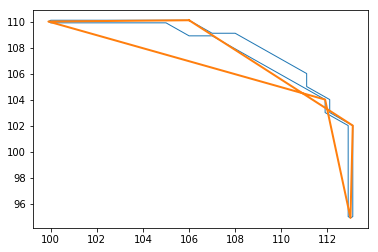

corners 6
79 contours
6 angles
angle 0
angle 1
angle 2
angle 3
angle 4


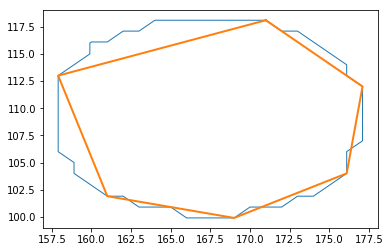

corners 7
71 contours
6 angles
angle 0
angle 1
angle 2
angle 3
angle 4


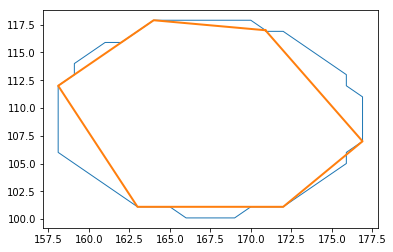

corners 7
31 contours
2 angles
angle 0


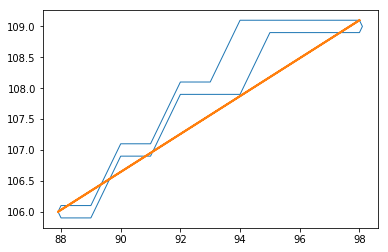

corners 3
115 contours
8 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6


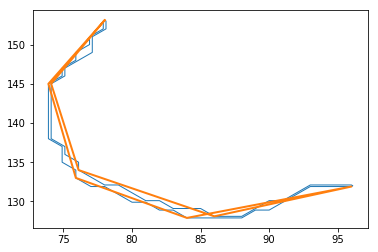

corners 9
97 contours
7 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5


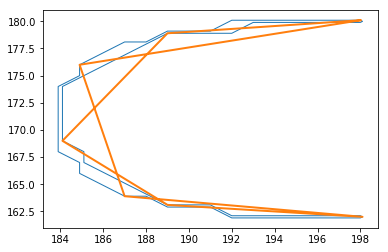

corners 8
image 6
85 contours
6 angles
angle 0
angle 1
angle 2
angle 3
angle 4


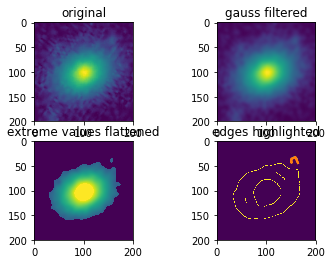

corners 7
1003 contours
28 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10
angle 11
angle 12
angle 13
angle 14
angle 15
angle 16
angle 17
angle 18
angle 19
angle 20
angle 21
angle 22
angle 23
angle 24
angle 25
angle 26


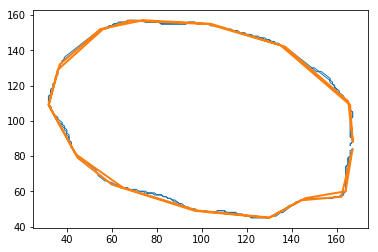

corners 29
73 contours
2 angles
angle 0


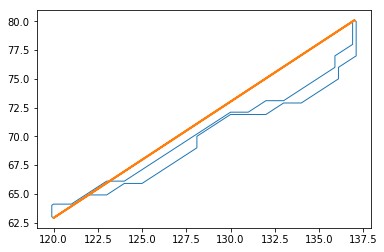

corners 3
427 contours
17 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10
angle 11
angle 12
angle 13
angle 14
angle 15


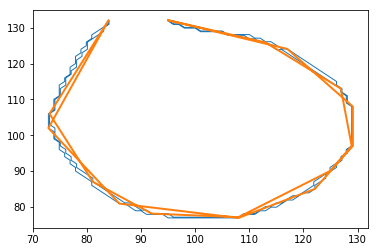

corners 18
41 contours
4 angles
angle 0
angle 1
angle 2


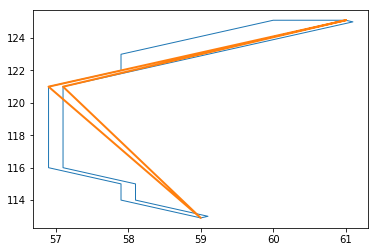

corners 5
image 7
383 contours
11 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9


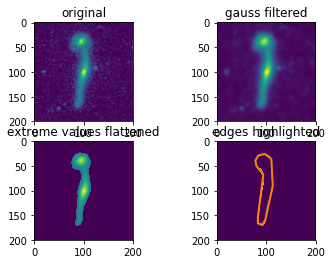

corners 12
375 contours
11 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9


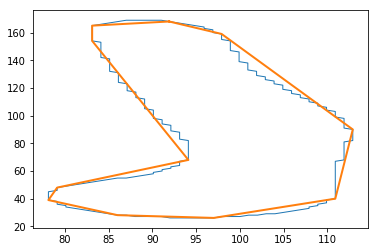

corners 12
image 8
57 contours
4 angles
angle 0
angle 1
angle 2


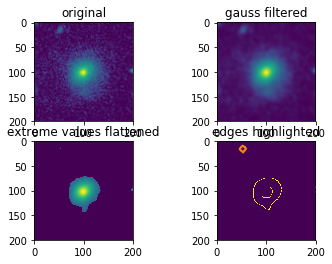

corners 5
49 contours
4 angles
angle 0
angle 1
angle 2


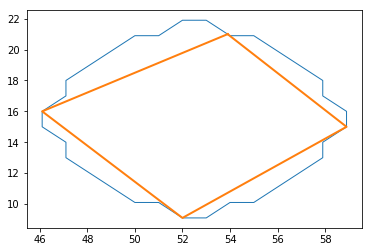

corners 5
485 contours
16 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10
angle 11
angle 12
angle 13
angle 14


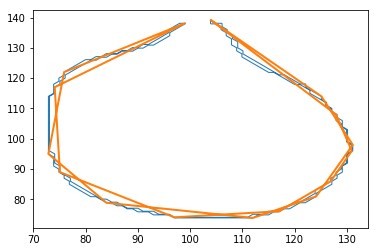

corners 17
117 contours
7 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5


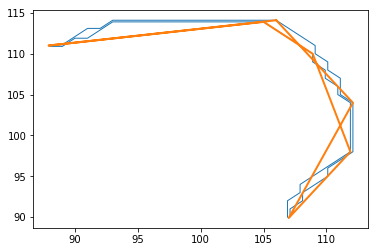

corners 8
35 contours
2 angles
angle 0


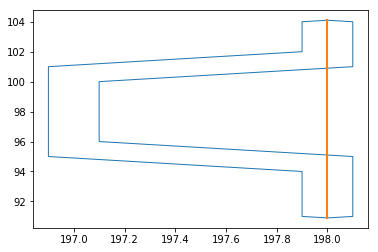

corners 3
image 9
115 contours
10 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8


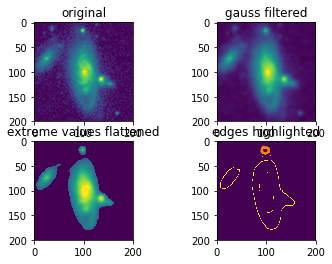

corners 11
457 contours
14 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10
angle 11
angle 12


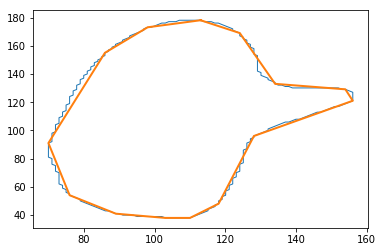

corners 15
449 contours
15 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10
angle 11
angle 12
angle 13


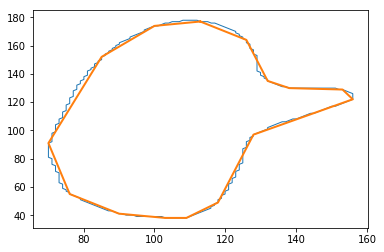

corners 16
167 contours
7 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5


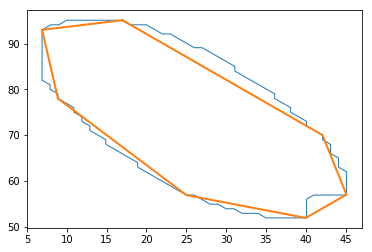

corners 8
159 contours
7 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5


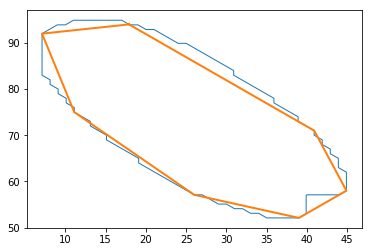

corners 8
47 contours
2 angles
angle 0


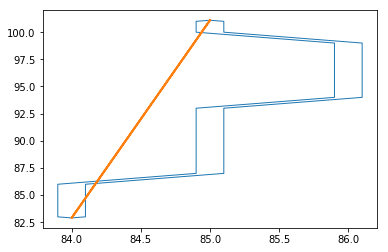

corners 3
49 contours
3 angles
angle 0
angle 1


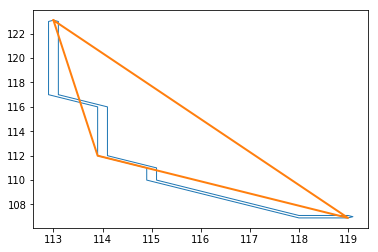

corners 4
53 contours
3 angles
angle 0
angle 1


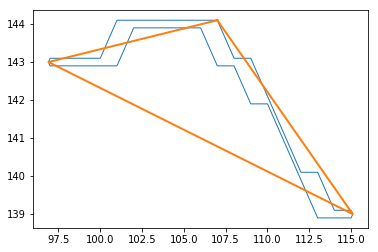

corners 4
image 10
531 contours
16 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10
angle 11
angle 12
angle 13
angle 14


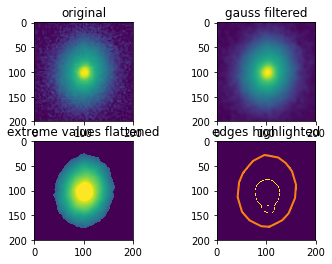

corners 17
523 contours
15 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10
angle 11
angle 12
angle 13


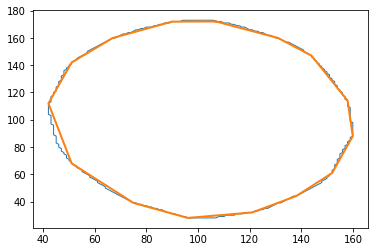

corners 16
473 contours
18 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10
angle 11
angle 12
angle 13
angle 14
angle 15
angle 16


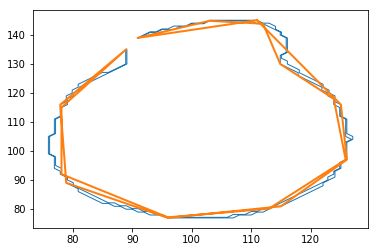

corners 19
image 11
251 contours
8 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6


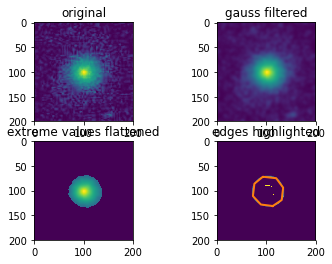

corners 9
243 contours
8 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6


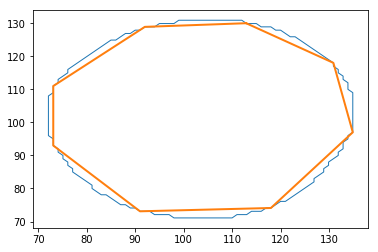

corners 9
39 contours
2 angles
angle 0


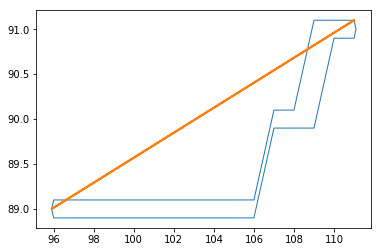

corners 3
37 contours
2 angles
angle 0


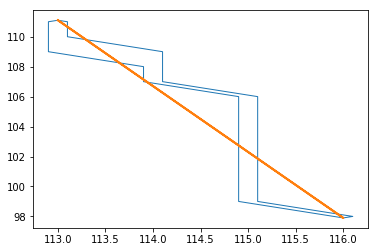

corners 3
image 12
383 contours
12 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10


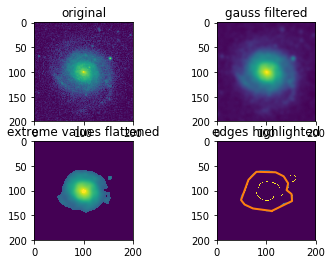

corners 13
375 contours
12 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10


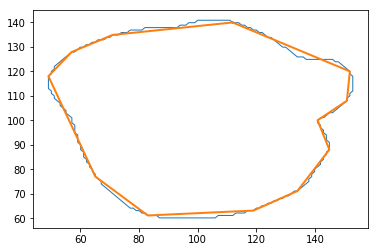

corners 13
71 contours
4 angles
angle 0
angle 1
angle 2


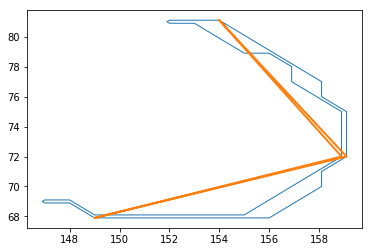

corners 5
327 contours
16 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10
angle 11
angle 12
angle 13
angle 14


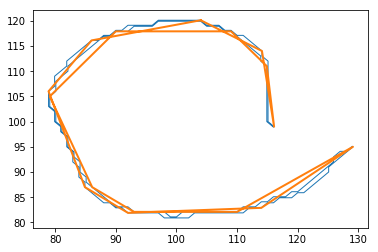

corners 17
image 13
315 contours
9 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7


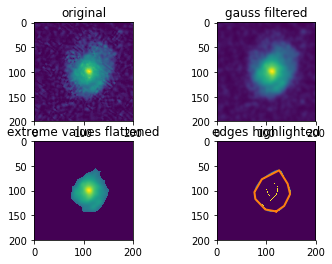

corners 10
307 contours
9 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7


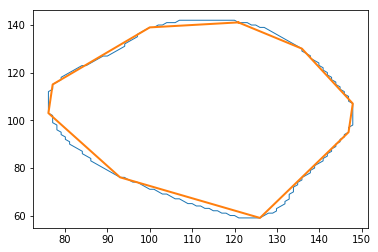

corners 10
89 contours
4 angles
angle 0
angle 1
angle 2


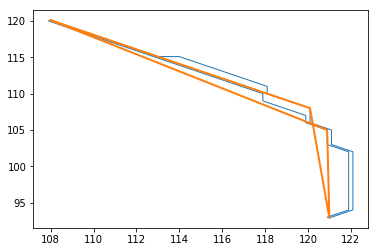

corners 5
53 contours
2 angles
angle 0


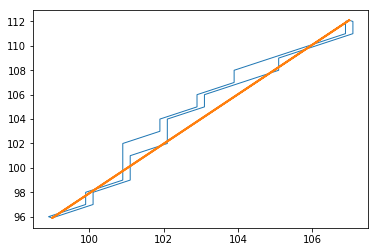

corners 3
image 14
65 contours
6 angles
angle 0
angle 1
angle 2
angle 3
angle 4


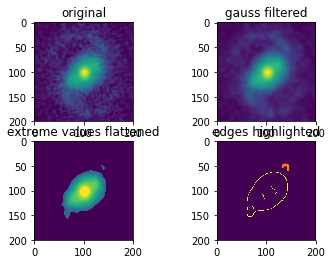

corners 7
351 contours
12 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10


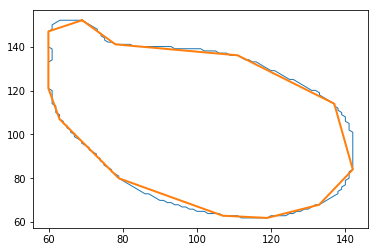

corners 13
343 contours
12 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10


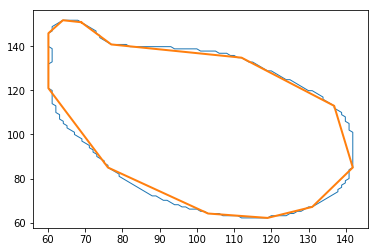

corners 13
35 contours
2 angles
angle 0


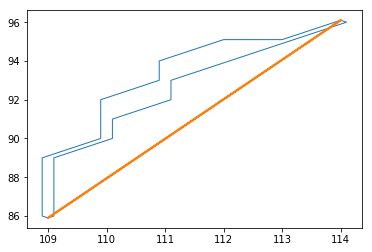

corners 3
41 contours
2 angles
angle 0


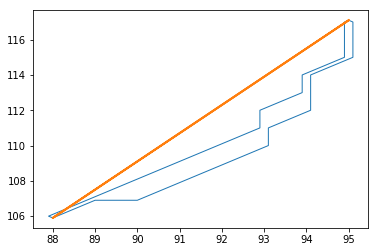

corners 3
image 15
291 contours
9 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7


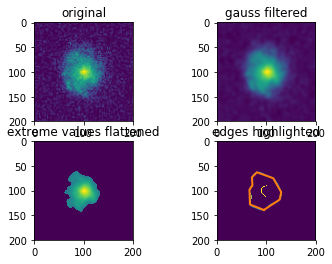

corners 10
283 contours
11 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9


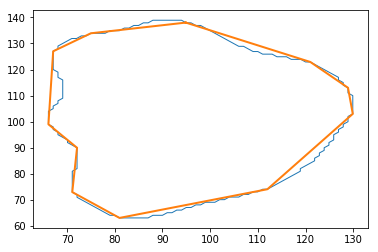

corners 12
111 contours
4 angles
angle 0
angle 1
angle 2


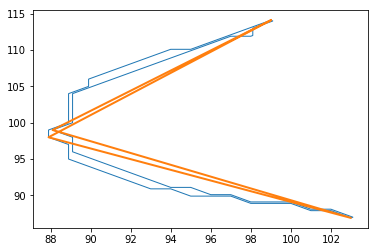

corners 5
image 16
319 contours
9 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7


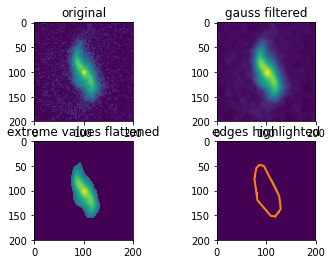

corners 10
311 contours
9 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7


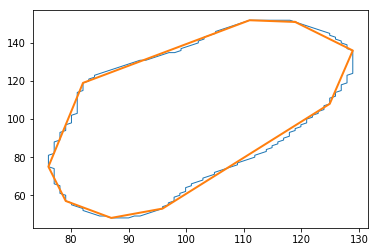

corners 10
image 17
61 contours
4 angles
angle 0
angle 1
angle 2


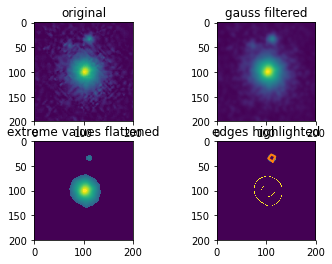

corners 5
53 contours
4 angles
angle 0
angle 1
angle 2


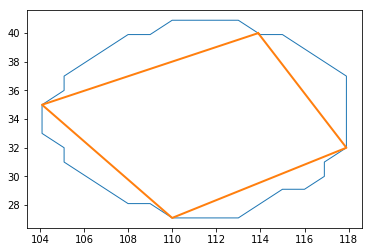

corners 5
241 contours
8 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6


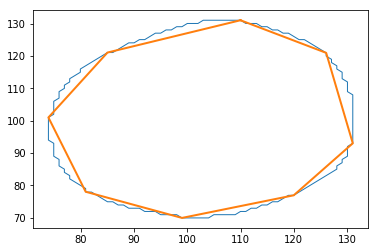

corners 9
233 contours
9 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7


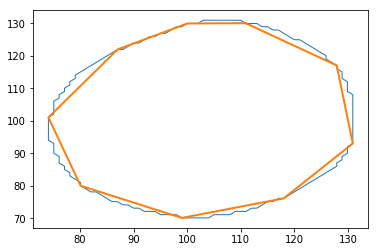

corners 10
39 contours
2 angles
angle 0


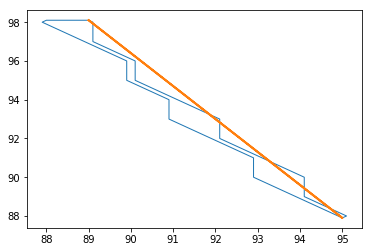

corners 3
63 contours
2 angles
angle 0


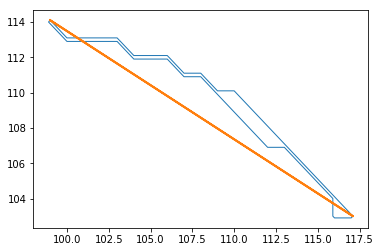

corners 3
image 18
389 contours
12 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10


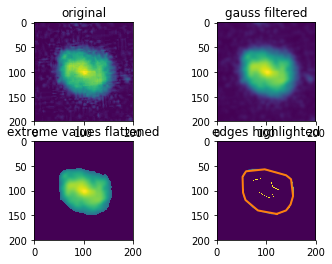

corners 13
381 contours
12 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10


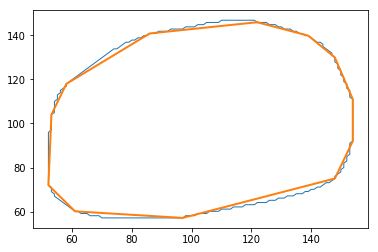

corners 13
53 contours
3 angles
angle 0
angle 1


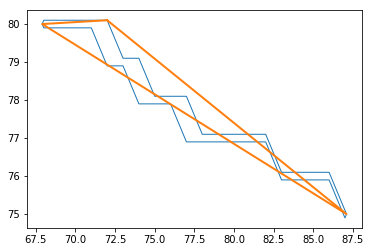

corners 4
69 contours
4 angles
angle 0
angle 1
angle 2


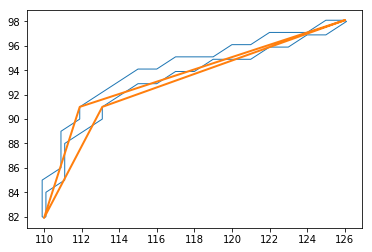

corners 5
83 contours
2 angles
angle 0


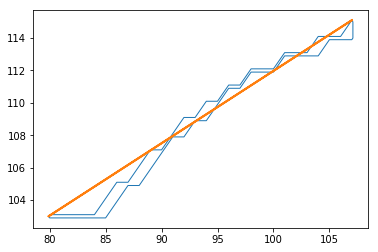

corners 3
image 19
433 contours
15 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10
angle 11
angle 12
angle 13


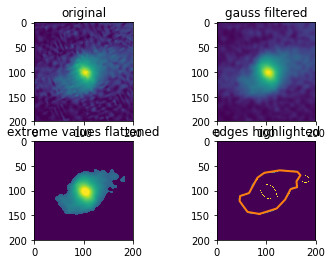

corners 16
423 contours
15 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10
angle 11
angle 12
angle 13


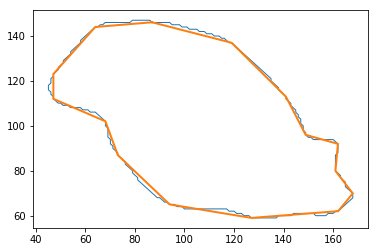

corners 16
85 contours
7 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5


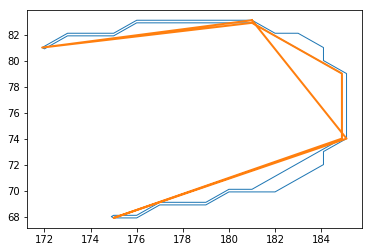

corners 8
95 contours
4 angles
angle 0
angle 1
angle 2


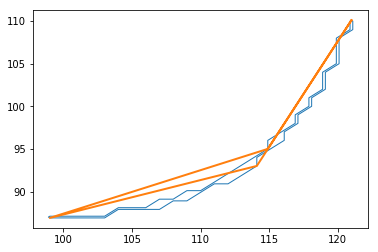

corners 5
93 contours
4 angles
angle 0
angle 1
angle 2


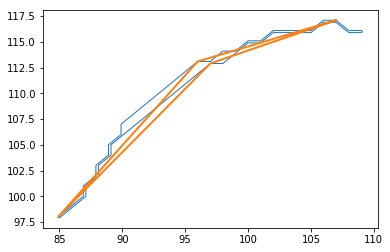

corners 5
image 20
223 contours
7 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5


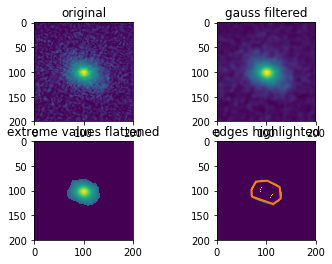

corners 8
215 contours
8 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6


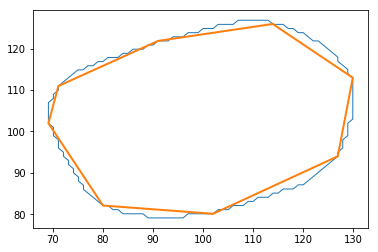

corners 9
35 contours
2 angles
angle 0


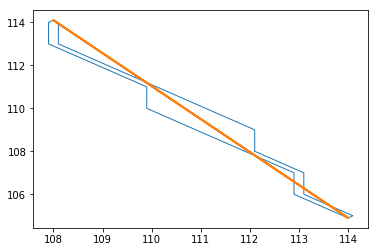

corners 3
image 21
461 contours
12 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10


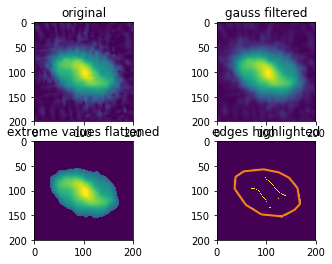

corners 13
453 contours
12 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10


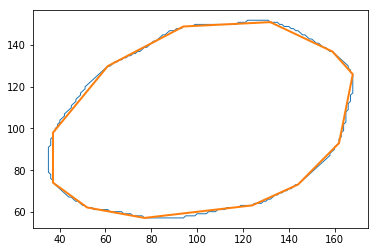

corners 13
179 contours
4 angles
angle 0
angle 1
angle 2


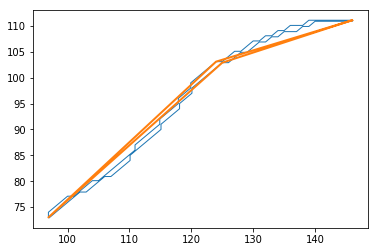

corners 5
131 contours
4 angles
angle 0
angle 1
angle 2


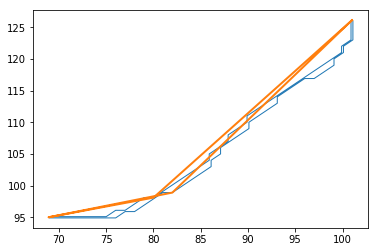

corners 5
image 22
301 contours
9 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7


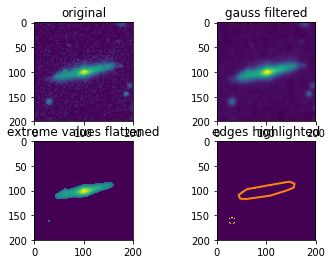

corners 10
293 contours
8 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6


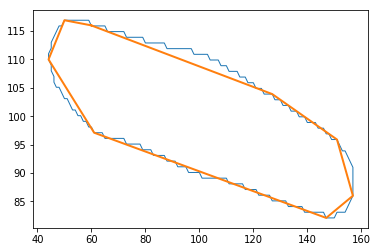

corners 9
55 contours
4 angles
angle 0
angle 1
angle 2


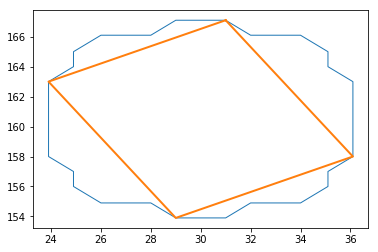

corners 5
47 contours
4 angles
angle 0
angle 1
angle 2


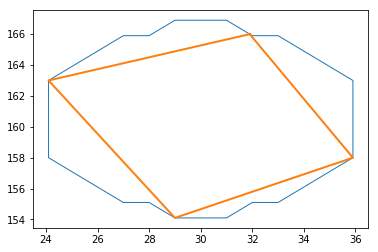

corners 5
image 23
359 contours
12 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10


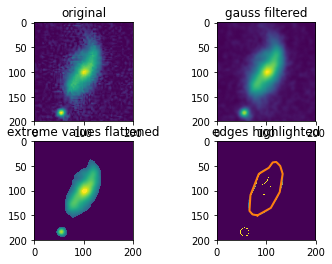

corners 13
351 contours
10 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8


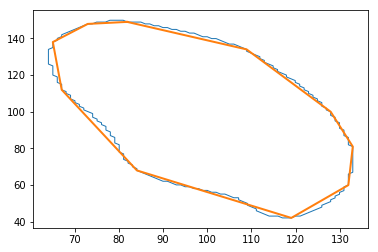

corners 11
61 contours
2 angles
angle 0


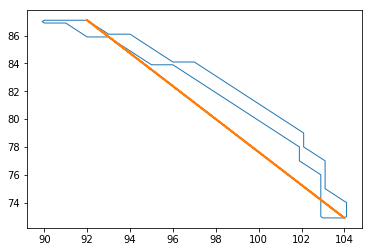

corners 3
73 contours
5 angles
angle 0
angle 1
angle 2
angle 3


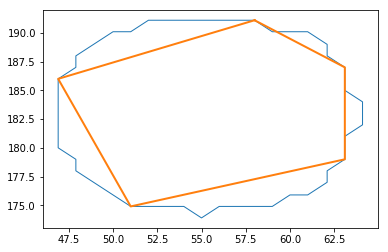

corners 6
65 contours
5 angles
angle 0
angle 1
angle 2
angle 3


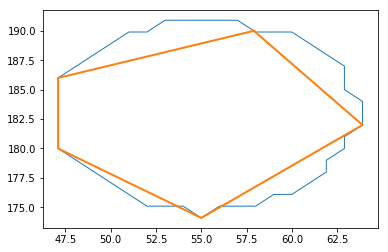

corners 6
image 24
837 contours
22 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10
angle 11
angle 12
angle 13
angle 14
angle 15
angle 16
angle 17
angle 18
angle 19
angle 20


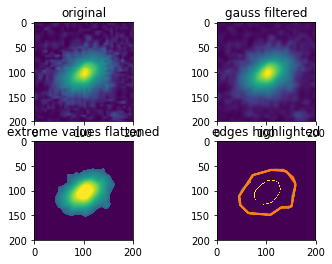

corners 23
361 contours
15 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10
angle 11
angle 12
angle 13


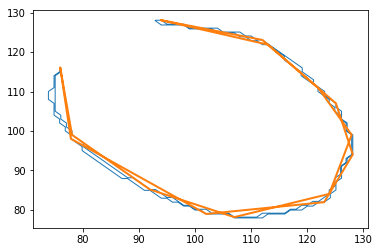

corners 16
image 25
243 contours
8 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6


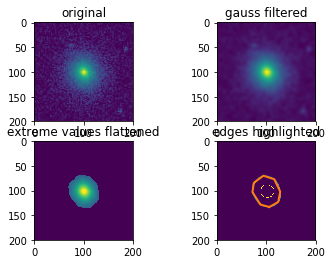

corners 9
235 contours
9 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7


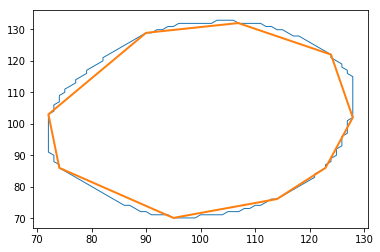

corners 10
195 contours
12 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10


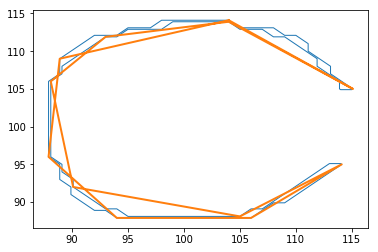

corners 13
image 26
101 contours
7 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5


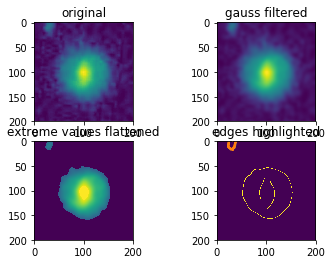

corners 8
415 contours
12 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10


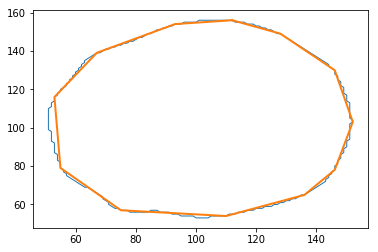

corners 13
407 contours
12 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10


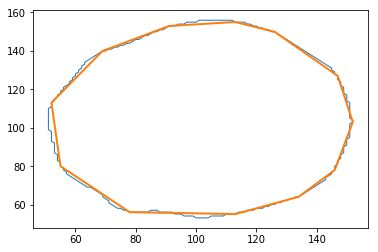

corners 13
149 contours
4 angles
angle 0
angle 1
angle 2


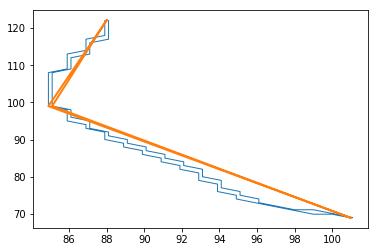

corners 5
161 contours
6 angles
angle 0
angle 1
angle 2
angle 3
angle 4


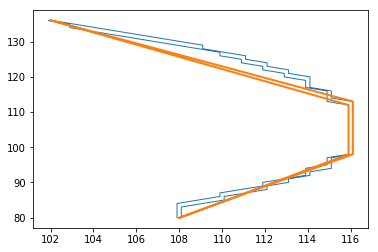

corners 7
image 27
337 contours
11 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9


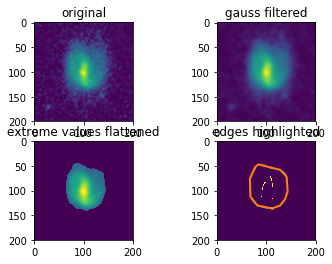

corners 12
329 contours
11 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9


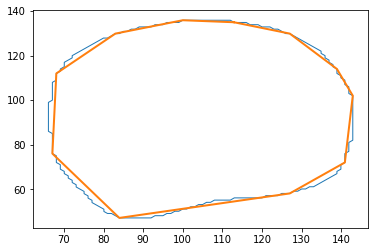

corners 12
119 contours
4 angles
angle 0
angle 1
angle 2


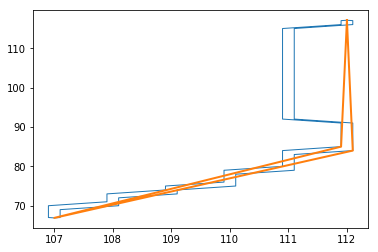

corners 5
83 contours
4 angles
angle 0
angle 1
angle 2


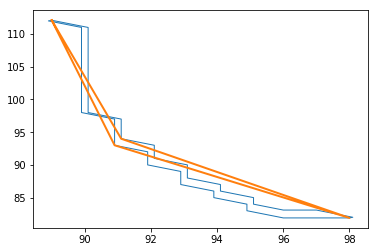

corners 5
image 28
285 contours
11 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9


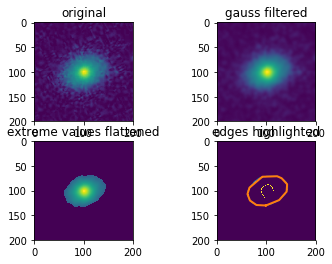

corners 12
277 contours
11 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9


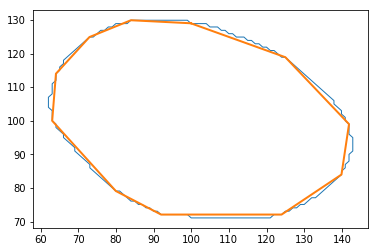

corners 12
173 contours
10 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8


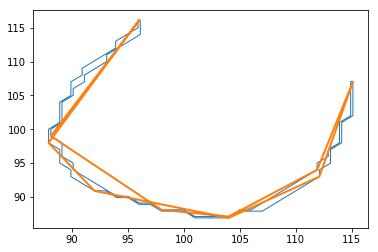

corners 11
image 29
73 contours
4 angles
angle 0
angle 1
angle 2


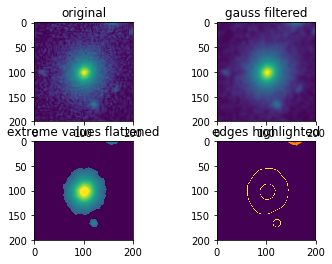

corners 5
355 contours
11 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9


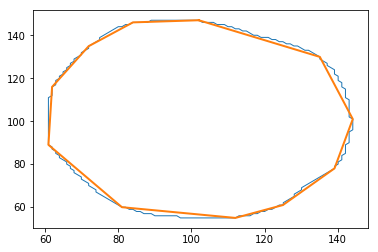

corners 12
347 contours
11 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9


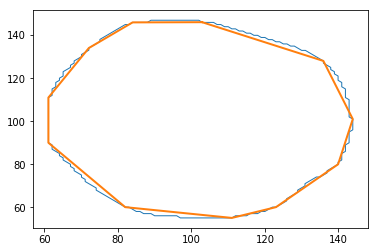

corners 12
133 contours
8 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6


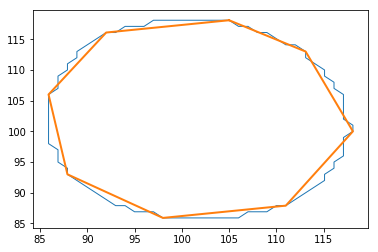

corners 9
125 contours
8 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6


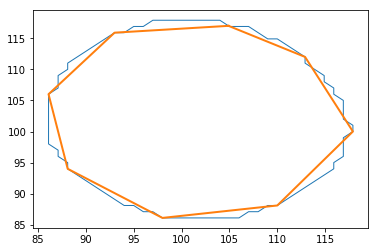

corners 9
65 contours
4 angles
angle 0
angle 1
angle 2


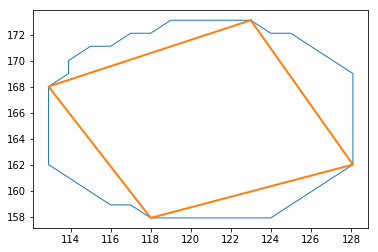

corners 5
57 contours
4 angles
angle 0
angle 1
angle 2


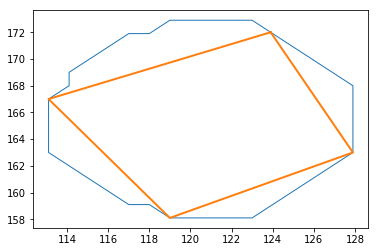

corners 5
image 30
301 contours
8 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6


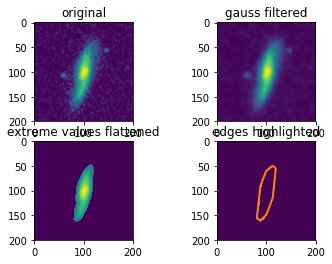

corners 9
293 contours
9 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7


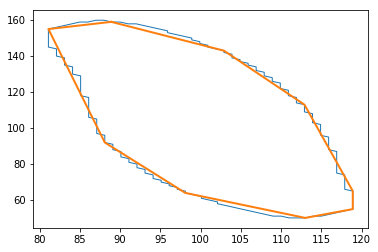

corners 10
image 31
57 contours
4 angles
angle 0
angle 1
angle 2


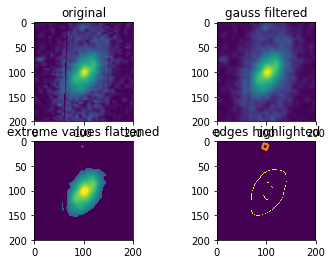

corners 5
49 contours
4 angles
angle 0
angle 1
angle 2


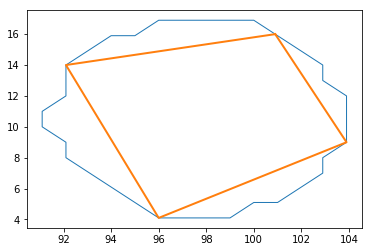

corners 5
335 contours
11 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9


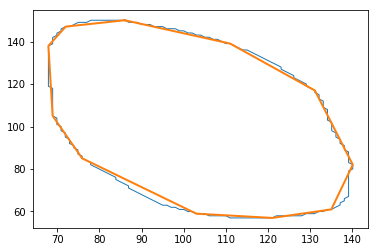

corners 12
327 contours
11 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9


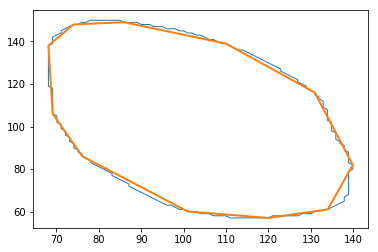

corners 12
41 contours
2 angles
angle 0


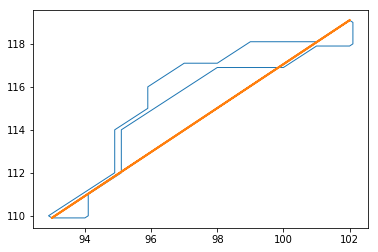

corners 3
image 32
327 contours
11 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9


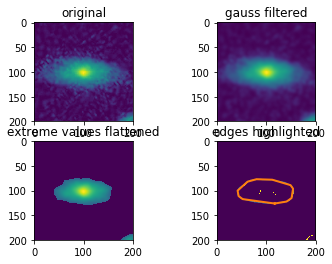

corners 12
319 contours
11 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9


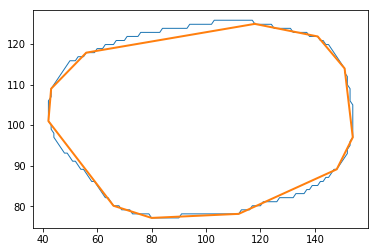

corners 12
37 contours
2 angles
angle 0


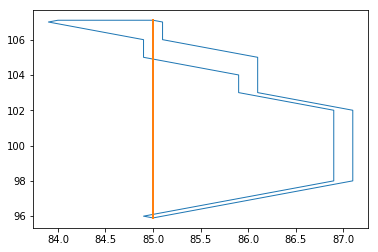

corners 3
61 contours
5 angles
angle 0
angle 1
angle 2
angle 3


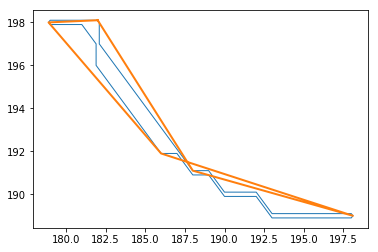

corners 6
image 33
69 contours
5 angles
angle 0
angle 1
angle 2
angle 3


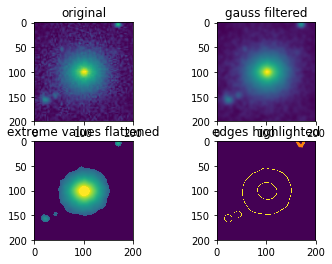

corners 6
391 contours
11 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9


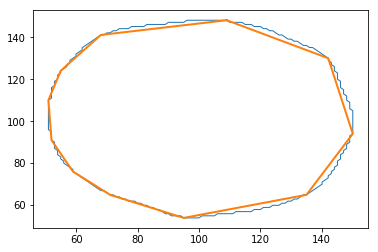

corners 12
383 contours
11 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9


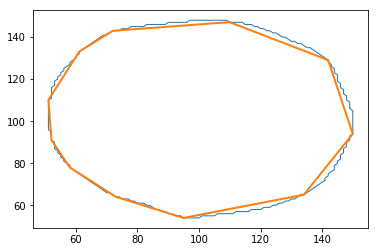

corners 12
155 contours
8 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6


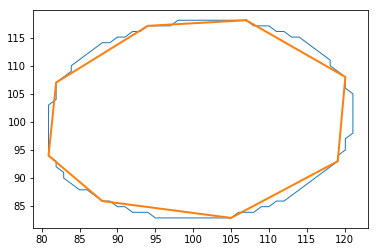

corners 9
147 contours
8 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6


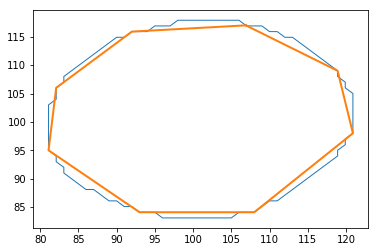

corners 9
83 contours
6 angles
angle 0
angle 1
angle 2
angle 3
angle 4


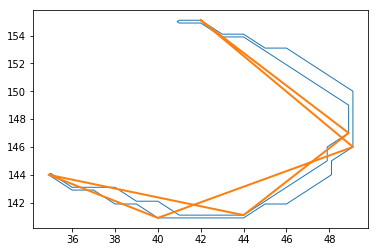

corners 7
65 contours
4 angles
angle 0
angle 1
angle 2


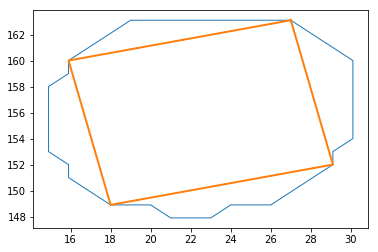

corners 5
57 contours
5 angles
angle 0
angle 1
angle 2
angle 3


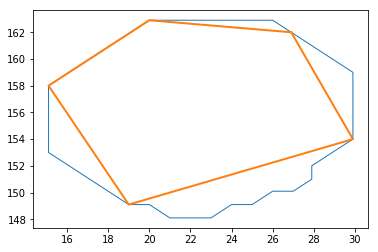

corners 6
image 34
57 contours
4 angles
angle 0
angle 1
angle 2


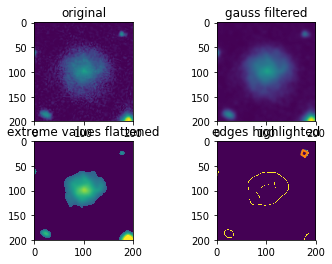

corners 5
49 contours
4 angles
angle 0
angle 1
angle 2


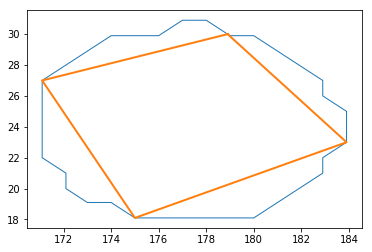

corners 5
43 contours
2 angles
angle 0


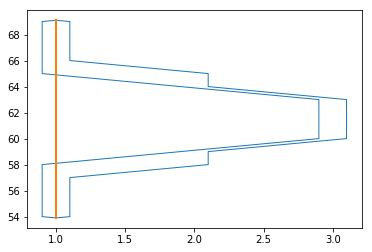

corners 3
307 contours
9 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7


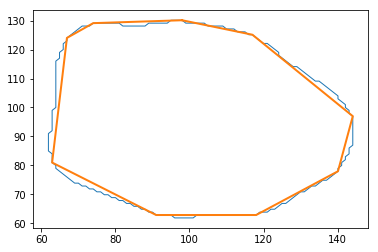

corners 10
299 contours
10 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8


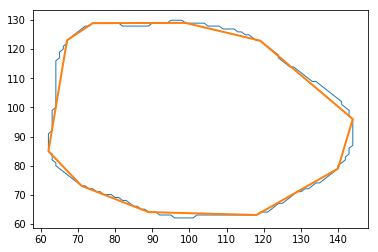

corners 11
51 contours
2 angles
angle 0


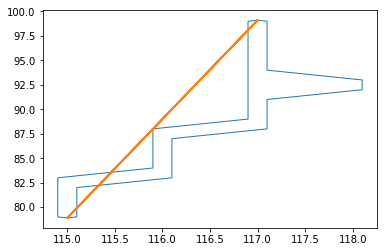

corners 3
43 contours
2 angles
angle 0


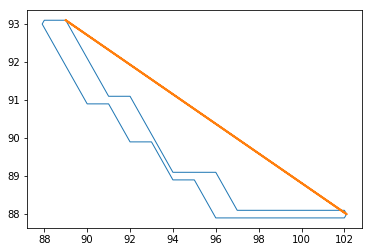

corners 3
41 contours
2 angles
angle 0


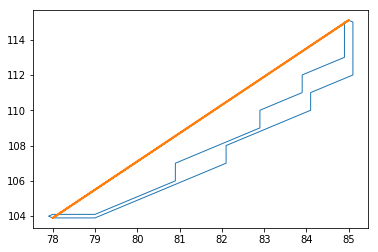

corners 3
73 contours
4 angles
angle 0
angle 1
angle 2


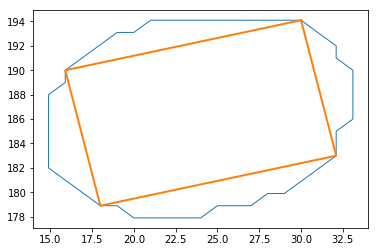

corners 5
65 contours
6 angles
angle 0
angle 1
angle 2
angle 3
angle 4


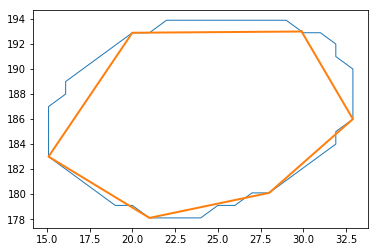

corners 7
77 contours
4 angles
angle 0
angle 1
angle 2


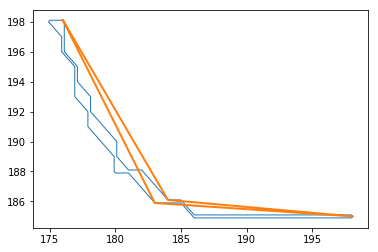

corners 5
image 35
67 contours
5 angles
angle 0
angle 1
angle 2
angle 3


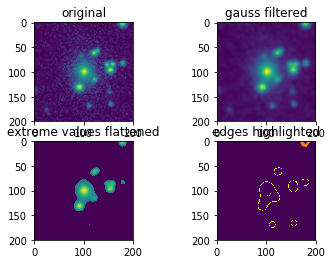

corners 6
69 contours
6 angles
angle 0
angle 1
angle 2
angle 3
angle 4


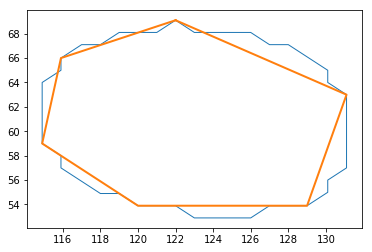

corners 7
61 contours
4 angles
angle 0
angle 1
angle 2


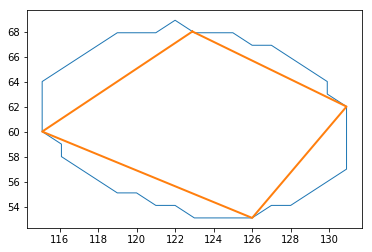

corners 5
85 contours
5 angles
angle 0
angle 1
angle 2
angle 3


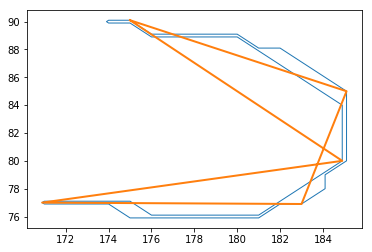

corners 6
91 contours
6 angles
angle 0
angle 1
angle 2
angle 3
angle 4


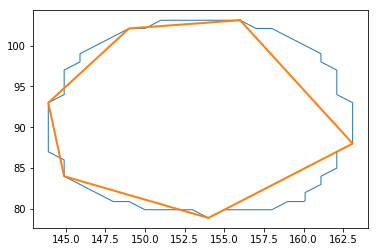

corners 7
83 contours
6 angles
angle 0
angle 1
angle 2
angle 3
angle 4


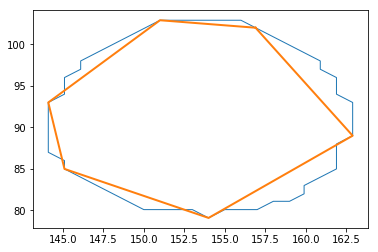

corners 7
423 contours
20 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10
angle 11
angle 12
angle 13
angle 14
angle 15
angle 16
angle 17
angle 18


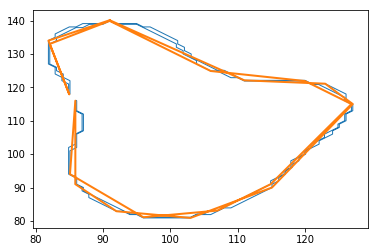

corners 21
53 contours
4 angles
angle 0
angle 1
angle 2


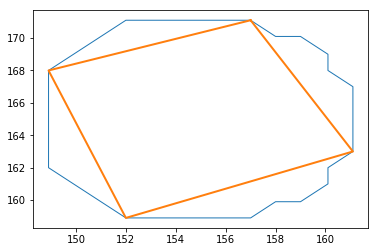

corners 5
45 contours
4 angles
angle 0
angle 1
angle 2


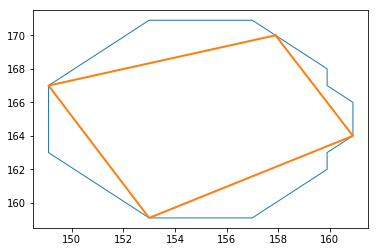

corners 5
55 contours
5 angles
angle 0
angle 1
angle 2
angle 3


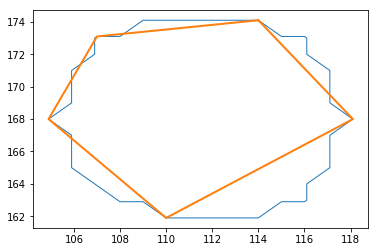

corners 6
47 contours
4 angles
angle 0
angle 1
angle 2


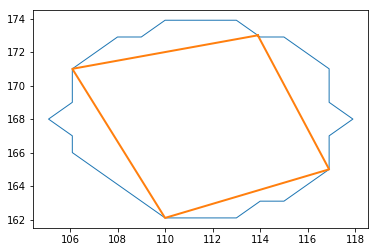

corners 5
image 36
437 contours
12 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10


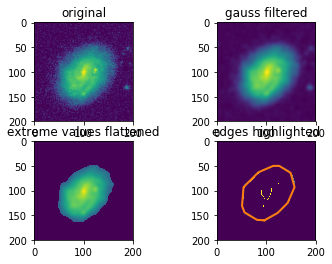

corners 13
429 contours
11 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9


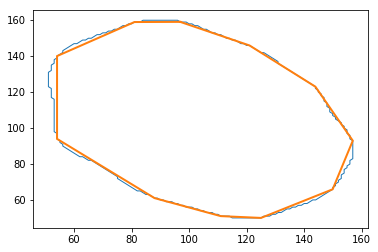

corners 12
145 contours
8 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6


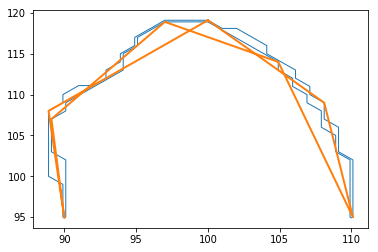

corners 9
image 37
321 contours
10 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8


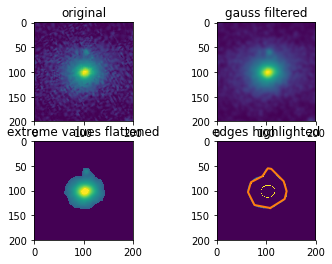

corners 11
313 contours
12 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10


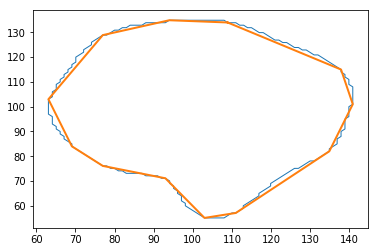

corners 13
113 contours
8 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6


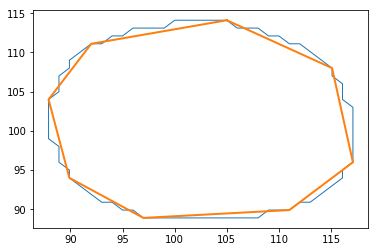

corners 9
105 contours
8 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6


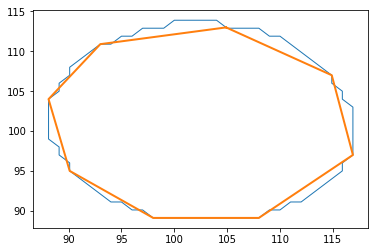

corners 9
image 38
529 contours
18 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10
angle 11
angle 12
angle 13
angle 14
angle 15
angle 16


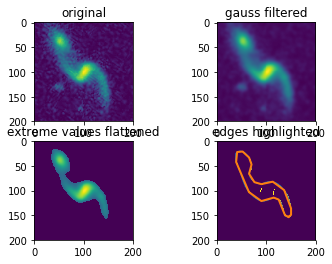

corners 19
521 contours
19 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10
angle 11
angle 12
angle 13
angle 14
angle 15
angle 16
angle 17


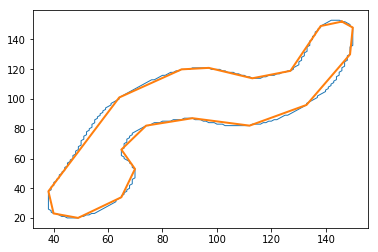

corners 20
35 contours
2 angles
angle 0


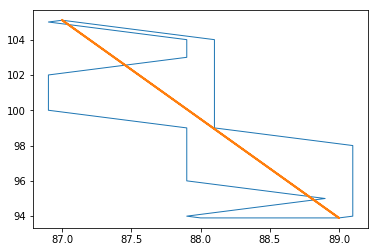

corners 3
35 contours
2 angles
angle 0


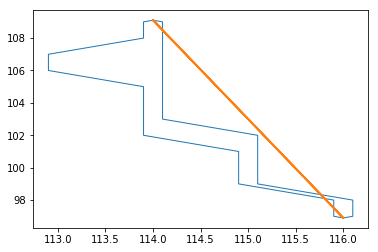

corners 3
image 39
493 contours
13 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10
angle 11


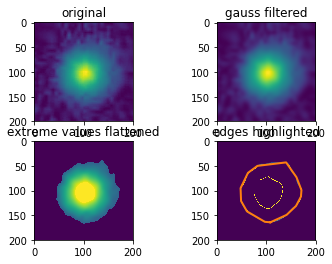

corners 14
485 contours
13 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10
angle 11


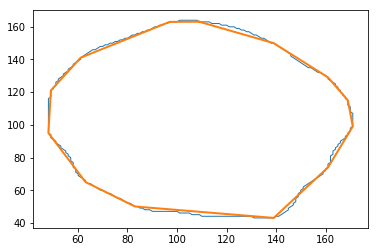

corners 14
55 contours
3 angles
angle 0
angle 1


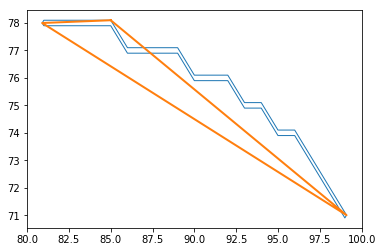

corners 4
397 contours
13 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10
angle 11


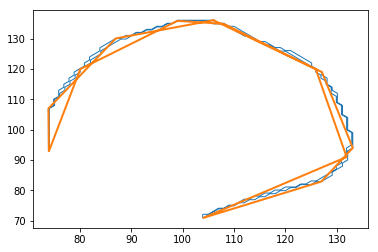

corners 14
image 40
441 contours
12 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10


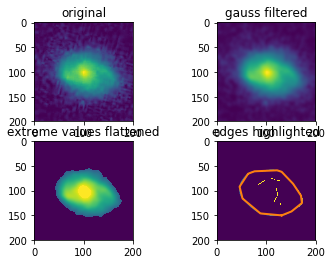

corners 13
433 contours
12 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10


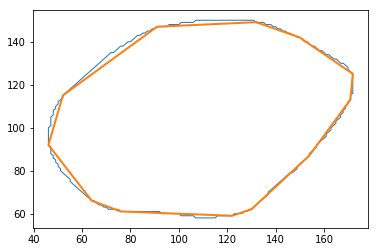

corners 13
49 contours
2 angles
angle 0


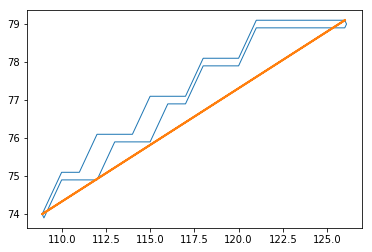

corners 3
59 contours
3 angles
angle 0
angle 1


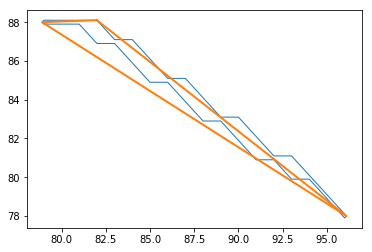

corners 4
75 contours
4 angles
angle 0
angle 1
angle 2


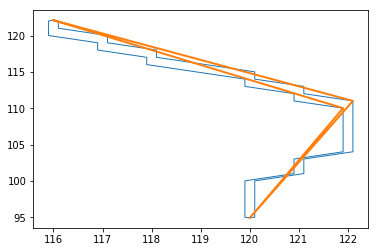

corners 5
image 41
255 contours
10 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8


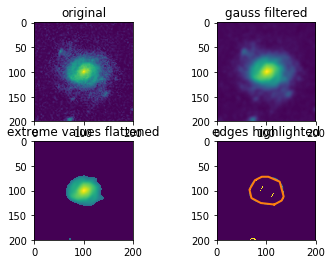

corners 11
247 contours
9 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7


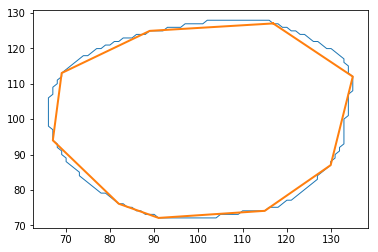

corners 10
43 contours
2 angles
angle 0


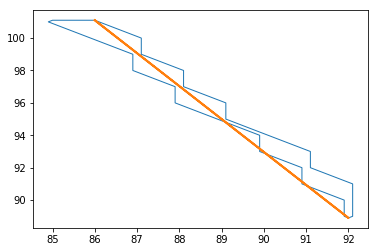

corners 3
33 contours
2 angles
angle 0


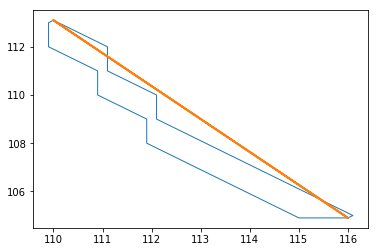

corners 3
35 contours
2 angles
angle 0


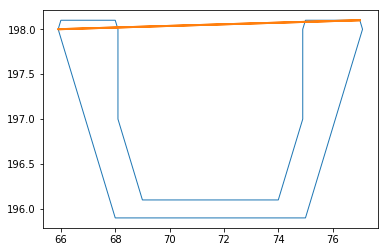

corners 3
image 42
289 contours
8 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6


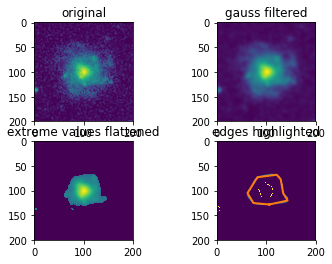

corners 9
281 contours
10 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8


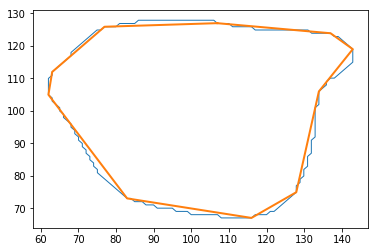

corners 11
105 contours
4 angles
angle 0
angle 1
angle 2


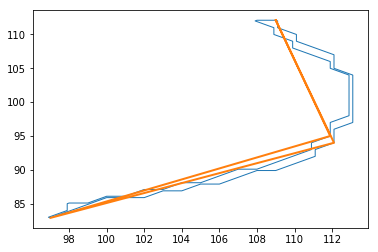

corners 5
57 contours
2 angles
angle 0


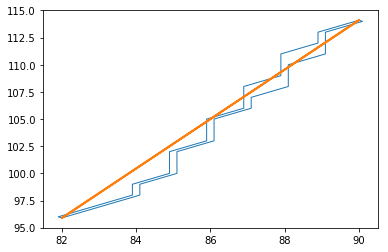

corners 3
49 contours
4 angles
angle 0
angle 1
angle 2


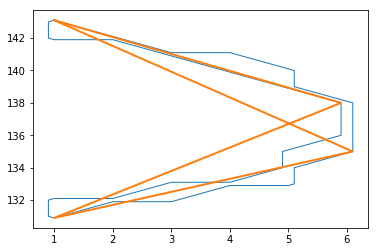

corners 5
image 43
377 contours
12 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10


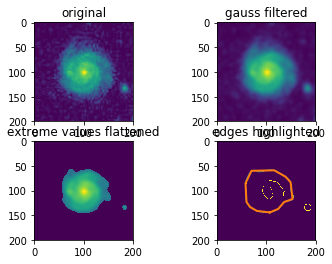

corners 13
369 contours
11 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9


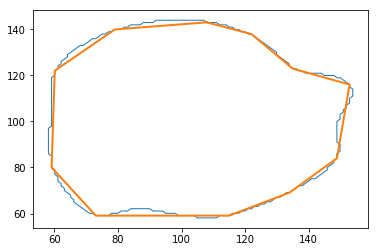

corners 12
109 contours
4 angles
angle 0
angle 1
angle 2


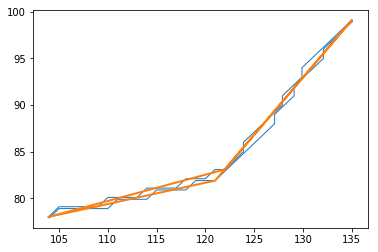

corners 5
137 contours
6 angles
angle 0
angle 1
angle 2
angle 3
angle 4


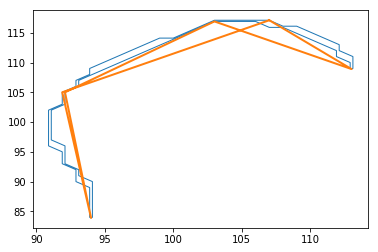

corners 7
41 contours
2 angles
angle 0


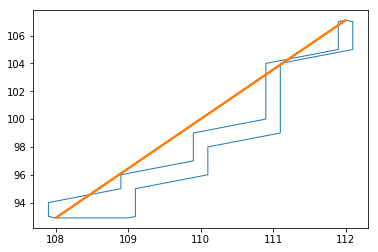

corners 3
57 contours
4 angles
angle 0
angle 1
angle 2


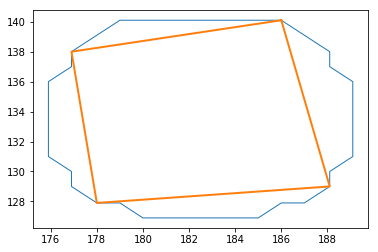

corners 5
49 contours
4 angles
angle 0
angle 1
angle 2


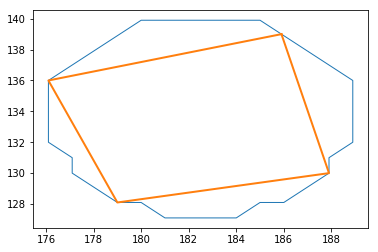

corners 5
image 44
159 contours
7 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5


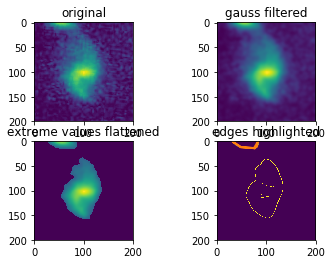

corners 8
783 contours
24 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10
angle 11
angle 12
angle 13
angle 14
angle 15
angle 16
angle 17
angle 18
angle 19
angle 20
angle 21
angle 22


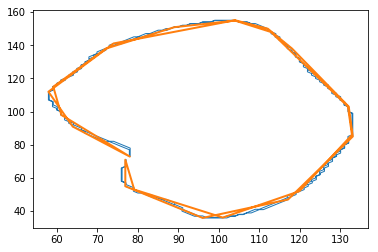

corners 25
35 contours
2 angles
angle 0


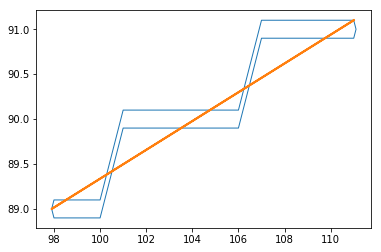

corners 3
57 contours
3 angles
angle 0
angle 1


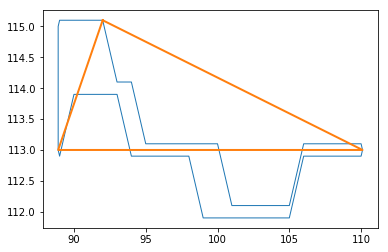

corners 4
image 45
521 contours
14 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10
angle 11
angle 12


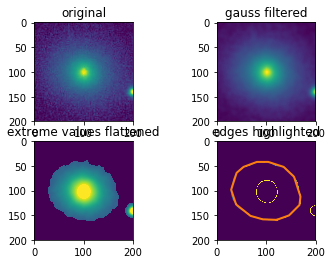

corners 15
513 contours
15 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10
angle 11
angle 12
angle 13


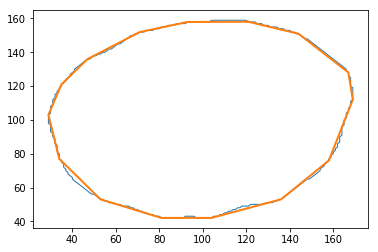

corners 16
183 contours
8 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6


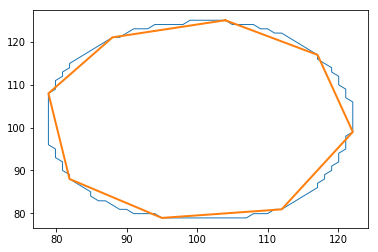

corners 9
175 contours
8 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6


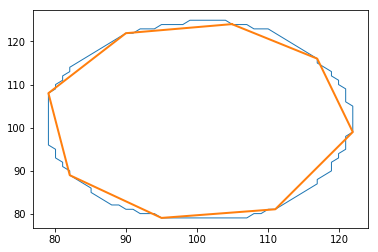

corners 9
87 contours
6 angles
angle 0
angle 1
angle 2
angle 3
angle 4


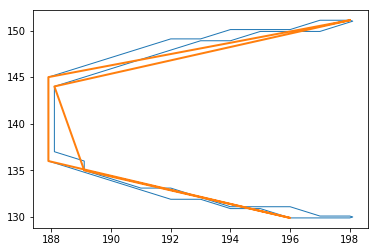

corners 7
image 46
31 contours
2 angles
angle 0


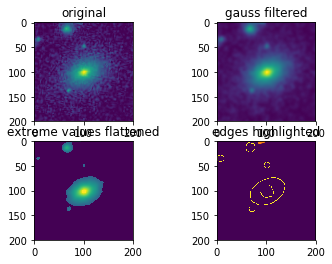

corners 3
81 contours
5 angles
angle 0
angle 1
angle 2
angle 3


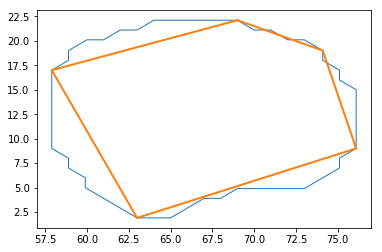

corners 6
71 contours
5 angles
angle 0
angle 1
angle 2
angle 3


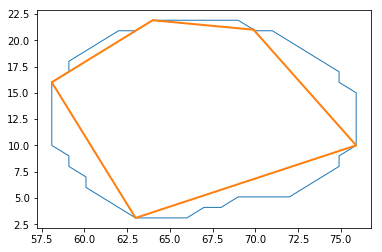

corners 6
57 contours
5 angles
angle 0
angle 1
angle 2
angle 3


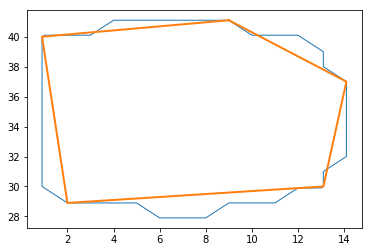

corners 6
49 contours
4 angles
angle 0
angle 1
angle 2


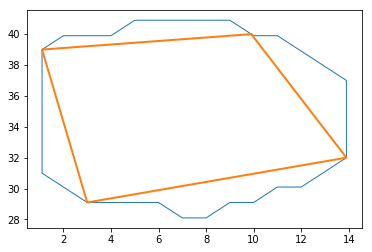

corners 5
55 contours
4 angles
angle 0
angle 1
angle 2


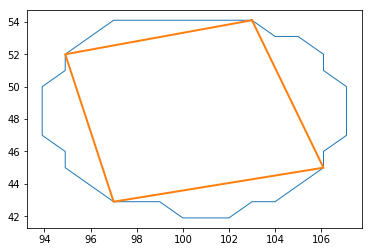

corners 5
47 contours
4 angles
angle 0
angle 1
angle 2


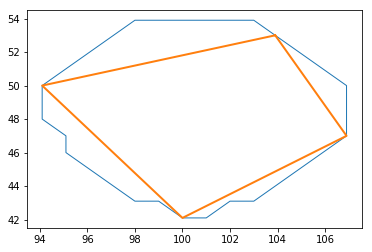

corners 5
257 contours
10 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8


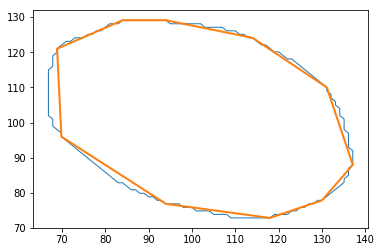

corners 11
249 contours
11 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9


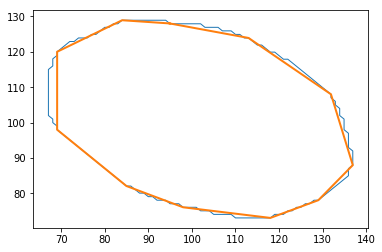

corners 12
71 contours
4 angles
angle 0
angle 1
angle 2


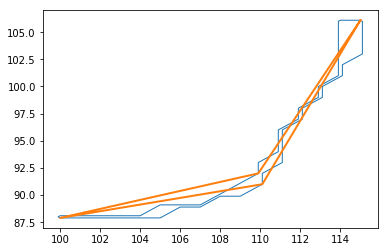

corners 5
79 contours
5 angles
angle 0
angle 1
angle 2
angle 3


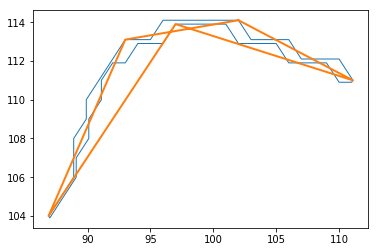

corners 6
65 contours
5 angles
angle 0
angle 1
angle 2
angle 3


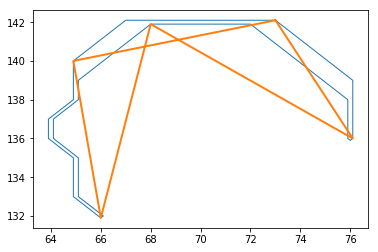

corners 6
image 47
415 contours
13 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10
angle 11


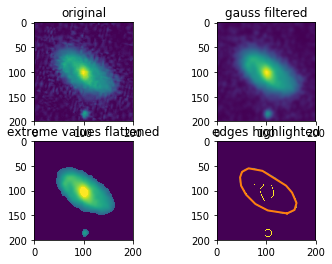

corners 14
407 contours
12 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10


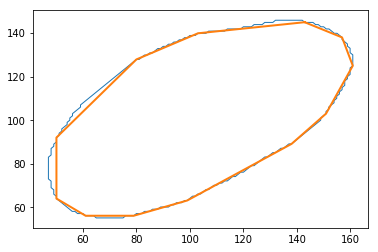

corners 13
105 contours
4 angles
angle 0
angle 1
angle 2


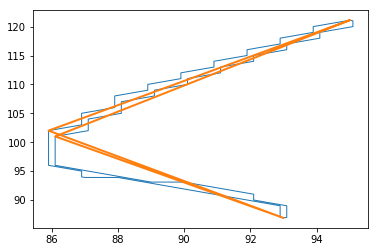

corners 5
77 contours
4 angles
angle 0
angle 1
angle 2


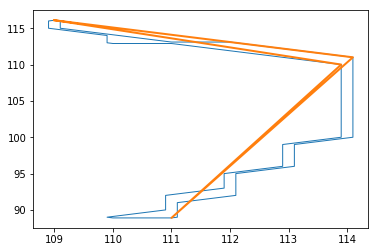

corners 5
61 contours
4 angles
angle 0
angle 1
angle 2


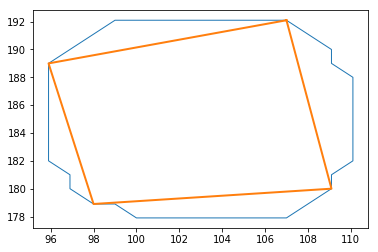

corners 5
53 contours
4 angles
angle 0
angle 1
angle 2


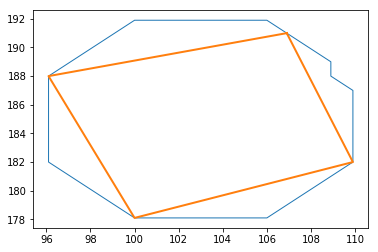

corners 5
image 48
57 contours
4 angles
angle 0
angle 1
angle 2


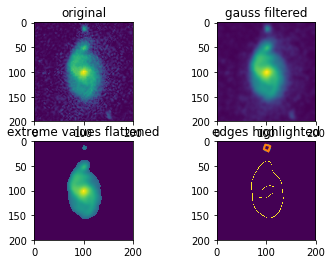

corners 5
49 contours
4 angles
angle 0
angle 1
angle 2


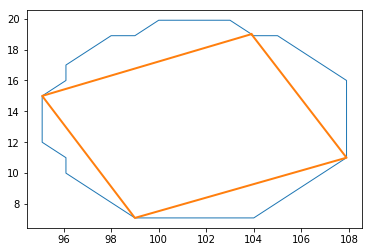

corners 5
365 contours
13 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10
angle 11


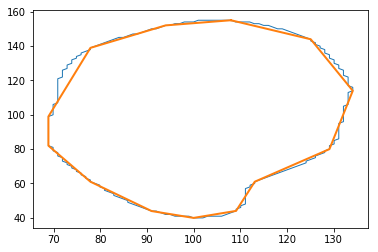

corners 14
357 contours
13 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10
angle 11


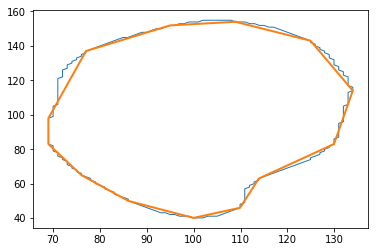

corners 14
81 contours
4 angles
angle 0
angle 1
angle 2


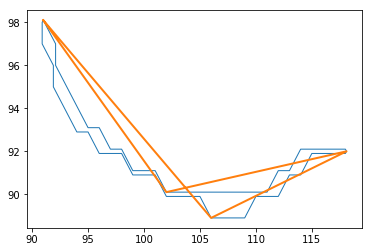

corners 5
79 contours
4 angles
angle 0
angle 1
angle 2


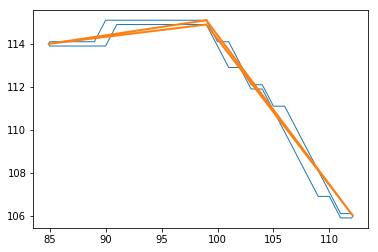

corners 5
image 49
411 contours
13 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10
angle 11


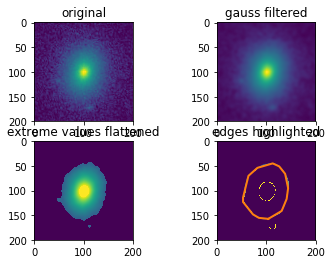

corners 14
403 contours
13 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10
angle 11


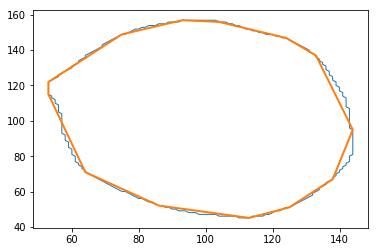

corners 14
151 contours
8 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6


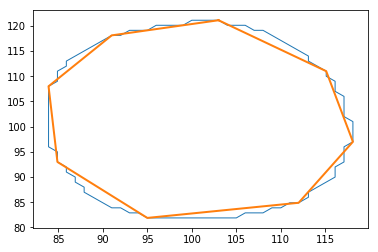

corners 9
143 contours
8 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6


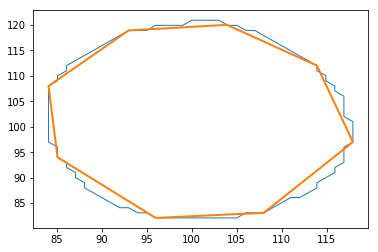

corners 9
73 contours
5 angles
angle 0
angle 1
angle 2
angle 3


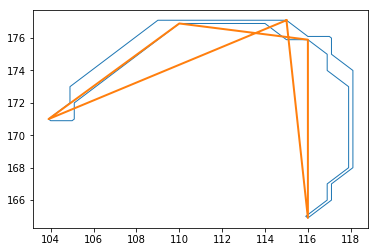

corners 6
image 50
65 contours
4 angles
angle 0
angle 1
angle 2


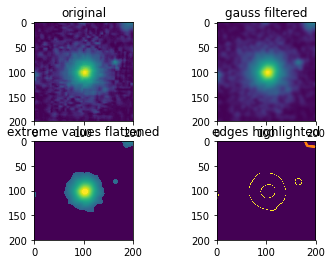

corners 5
307 contours
10 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8


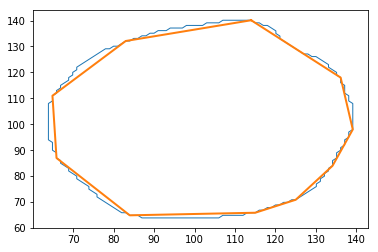

corners 11
299 contours
10 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8


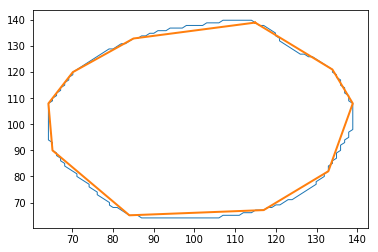

corners 11
59 contours
4 angles
angle 0
angle 1
angle 2


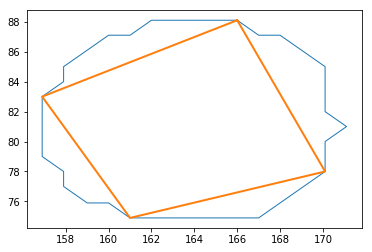

corners 5
51 contours
4 angles
angle 0
angle 1
angle 2


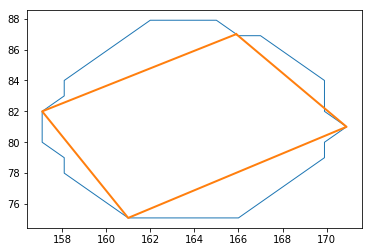

corners 5
121 contours
7 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5


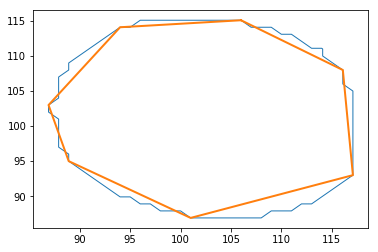

corners 8
113 contours
7 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5


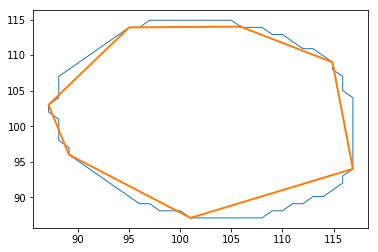

corners 8
43 contours
2 angles
angle 0


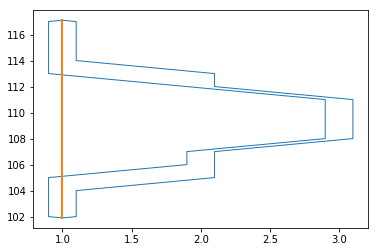

corners 3
image 51
321 contours
9 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7


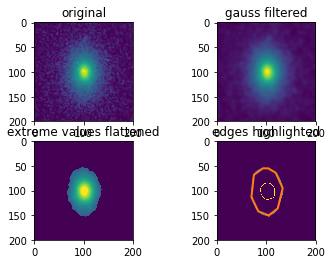

corners 10
313 contours
11 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9


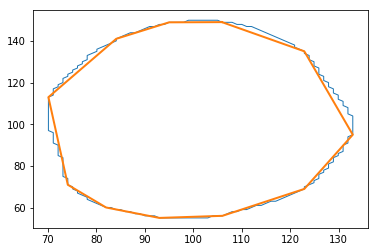

corners 12
247 contours
16 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10
angle 11
angle 12
angle 13
angle 14


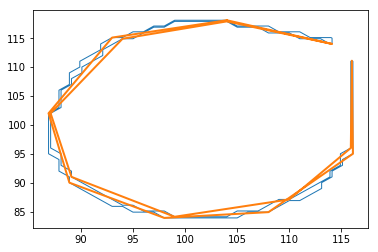

corners 17
image 52
225 contours
10 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8


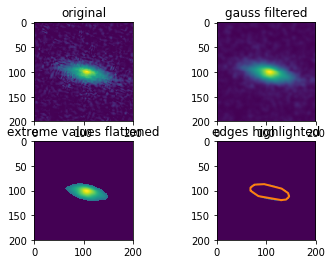

corners 11
217 contours
9 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7


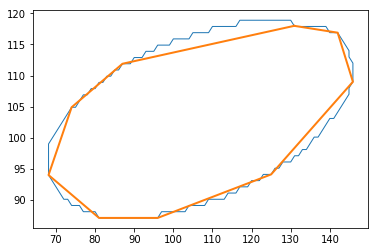

corners 10
image 53
665 contours
27 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10
angle 11
angle 12
angle 13
angle 14
angle 15
angle 16
angle 17
angle 18
angle 19
angle 20
angle 21
angle 22
angle 23
angle 24
angle 25


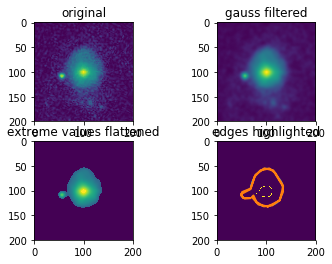

corners 28
179 contours
10 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8


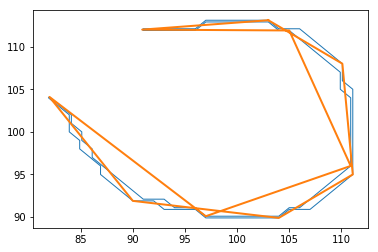

corners 11
image 54
363 contours
11 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9


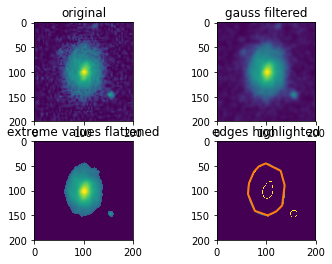

corners 12
355 contours
12 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10


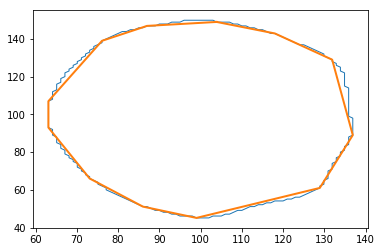

corners 13
119 contours
7 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5


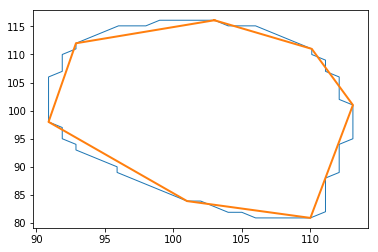

corners 8
111 contours
5 angles
angle 0
angle 1
angle 2
angle 3


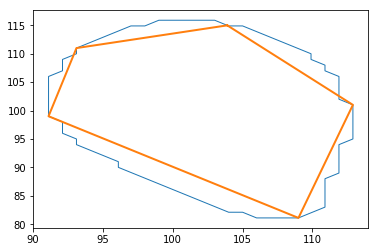

corners 6
57 contours
4 angles
angle 0
angle 1
angle 2


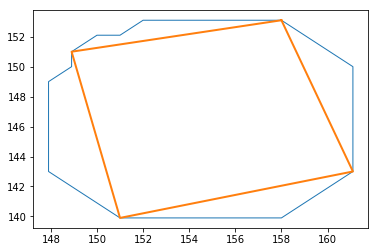

corners 5
49 contours
4 angles
angle 0
angle 1
angle 2


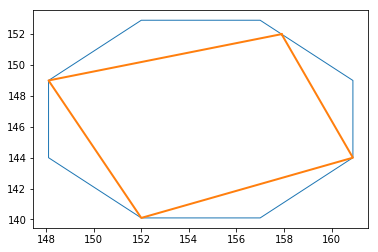

corners 5
image 55
473 contours
11 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9


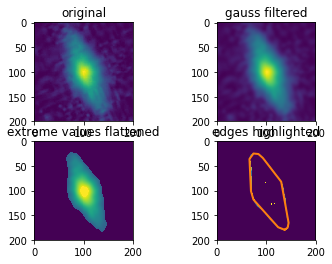

corners 12
465 contours
10 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8


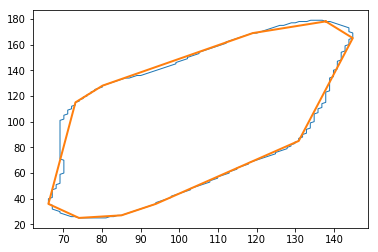

corners 11
image 56
53 contours
4 angles
angle 0
angle 1
angle 2


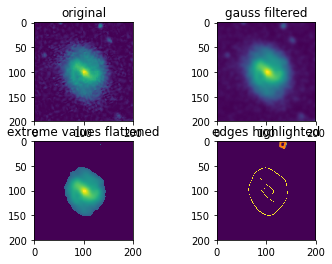

corners 5
45 contours
4 angles
angle 0
angle 1
angle 2


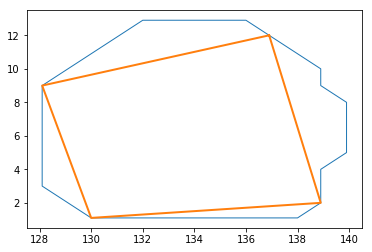

corners 5
357 contours
11 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9


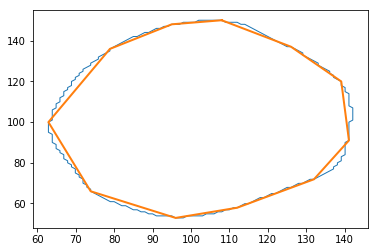

corners 12
349 contours
9 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7


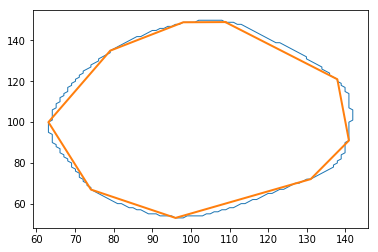

corners 10
133 contours
4 angles
angle 0
angle 1
angle 2


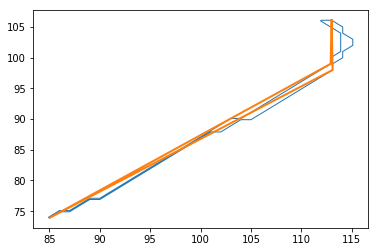

corners 5
123 contours
2 angles
angle 0


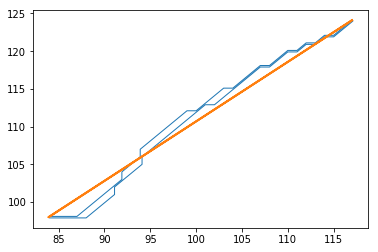

corners 3
image 57
299 contours
10 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8


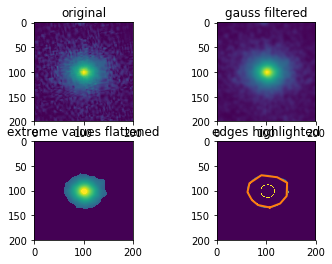

corners 11
291 contours
10 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8


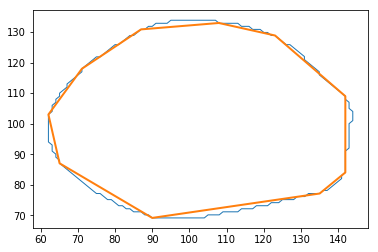

corners 11
115 contours
7 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5


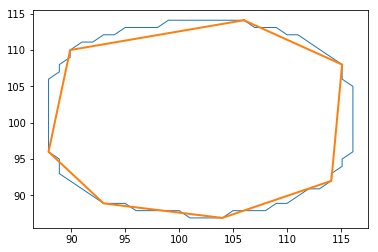

corners 8
107 contours
8 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6


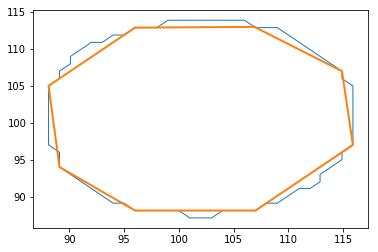

corners 9
image 58
37 contours
2 angles
angle 0


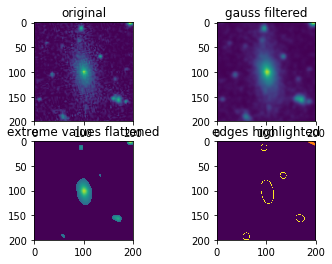

corners 3
57 contours
4 angles
angle 0
angle 1
angle 2


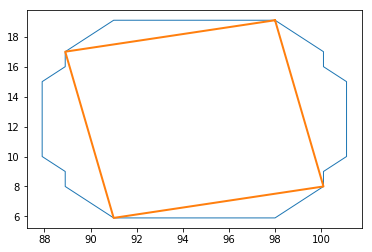

corners 5
49 contours
4 angles
angle 0
angle 1
angle 2


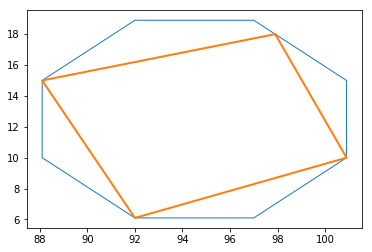

corners 5
55 contours
4 angles
angle 0
angle 1
angle 2


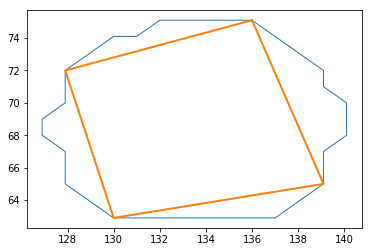

corners 5
47 contours
4 angles
angle 0
angle 1
angle 2


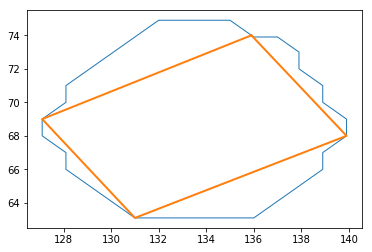

corners 5
153 contours
8 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6


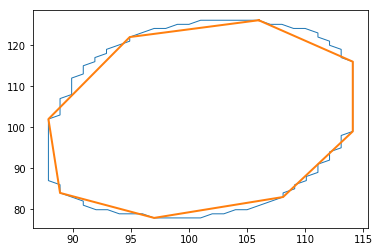

corners 9
145 contours
8 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6


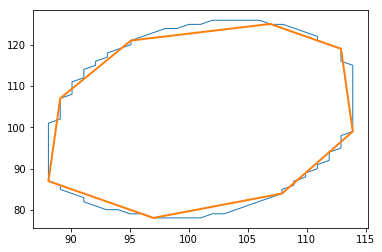

corners 9
69 contours
5 angles
angle 0
angle 1
angle 2
angle 3


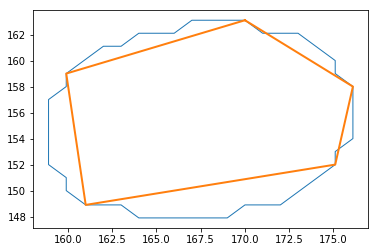

corners 6
61 contours
4 angles
angle 0
angle 1
angle 2


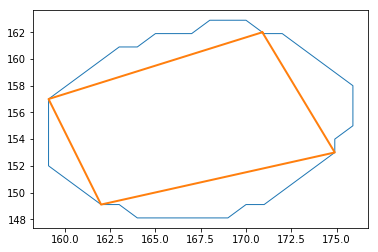

corners 5
59 contours
4 angles
angle 0
angle 1
angle 2


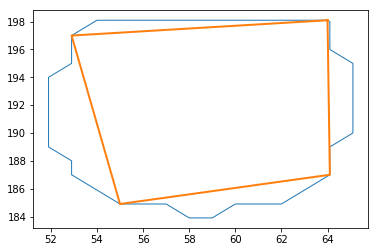

corners 5
51 contours
4 angles
angle 0
angle 1
angle 2


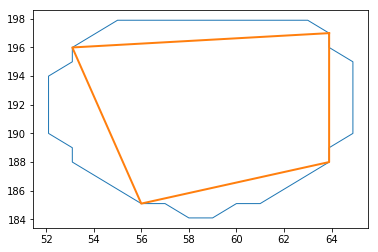

corners 5
image 59
515 contours
14 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10
angle 11
angle 12


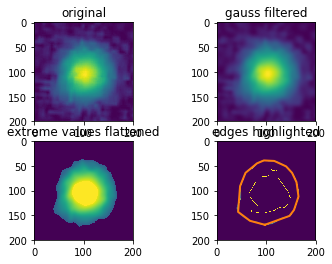

corners 15
507 contours
14 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10
angle 11
angle 12


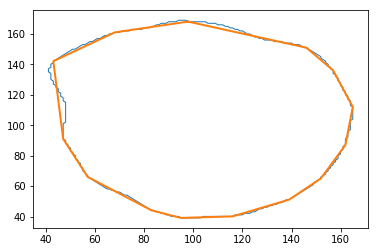

corners 15
35 contours
2 angles
angle 0


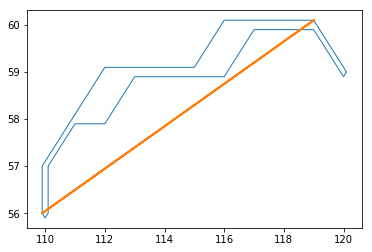

corners 3
41 contours
3 angles
angle 0
angle 1


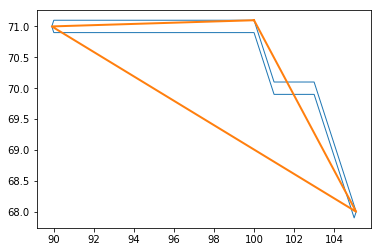

corners 4
139 contours
2 angles
angle 0


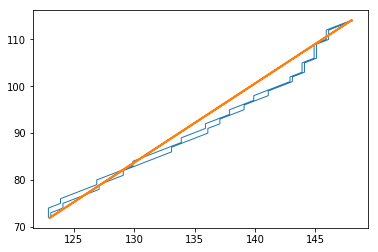

corners 3
75 contours
2 angles
angle 0


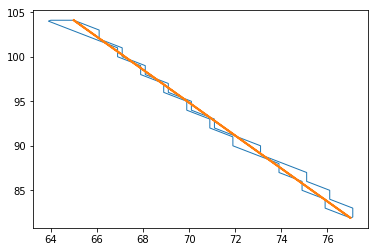

corners 3
73 contours
2 angles
angle 0


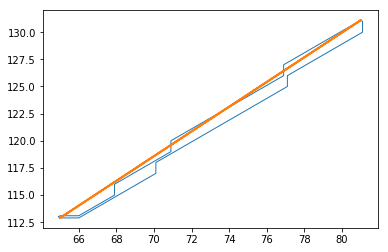

corners 3
45 contours
3 angles
angle 0
angle 1


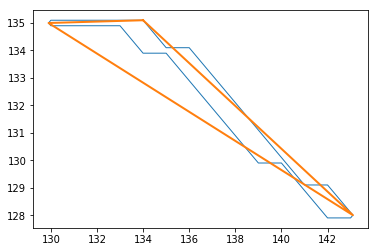

corners 4
127 contours
4 angles
angle 0
angle 1
angle 2


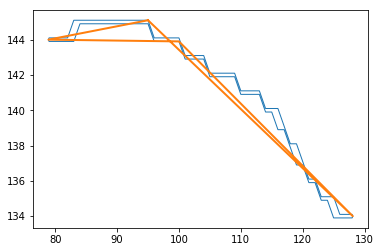

corners 5
image 60
57 contours
4 angles
angle 0
angle 1
angle 2


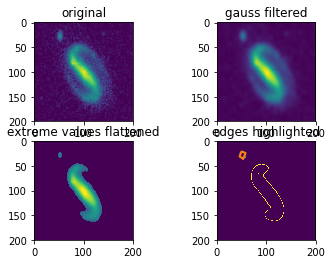

corners 5
49 contours
4 angles
angle 0
angle 1
angle 2


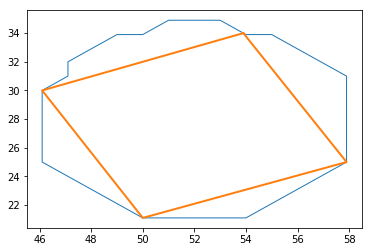

corners 5
355 contours
11 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9


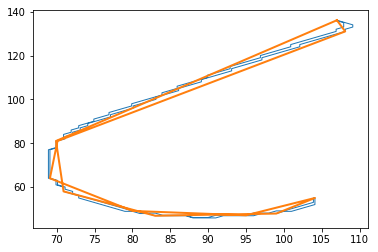

corners 12
457 contours
16 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10
angle 11
angle 12
angle 13
angle 14


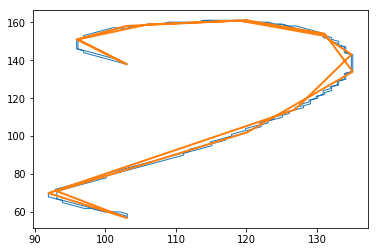

corners 17
image 61
41 contours
4 angles
angle 0
angle 1
angle 2


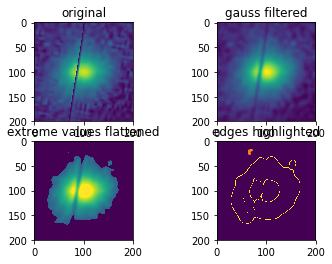

corners 5
589 contours
19 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10
angle 11
angle 12
angle 13
angle 14
angle 15
angle 16
angle 17


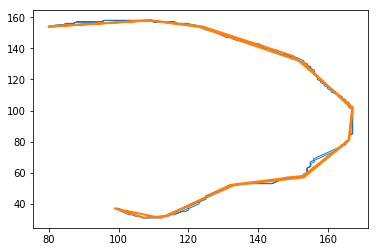

corners 20
537 contours
17 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10
angle 11
angle 12
angle 13
angle 14
angle 15


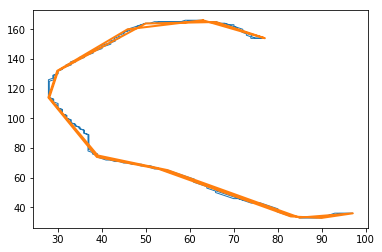

corners 18
77 contours
6 angles
angle 0
angle 1
angle 2
angle 3
angle 4


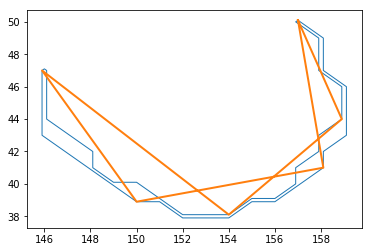

corners 7
121 contours
4 angles
angle 0
angle 1
angle 2


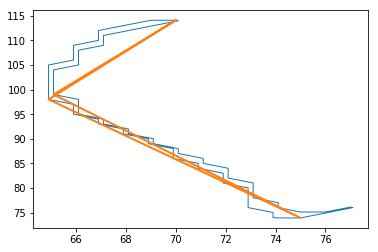

corners 5
65 contours
4 angles
angle 0
angle 1
angle 2


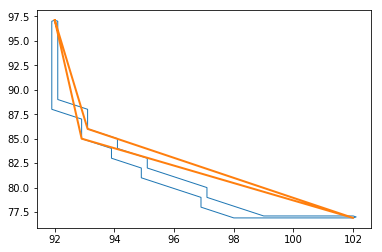

corners 5
257 contours
12 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10


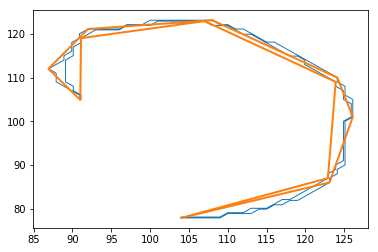

corners 13
43 contours
3 angles
angle 0
angle 1


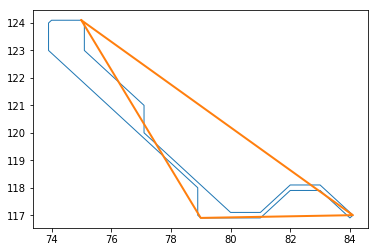

corners 4
image 62
105 contours
5 angles
angle 0
angle 1
angle 2
angle 3


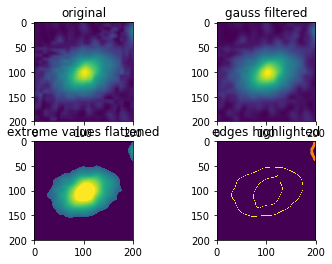

corners 6
493 contours
13 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10
angle 11


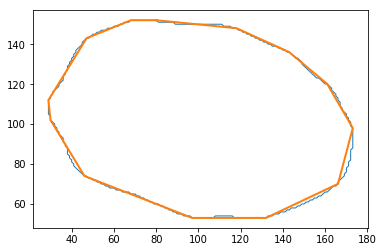

corners 14
485 contours
13 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10
angle 11


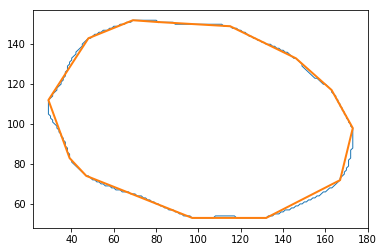

corners 14
257 contours
8 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6


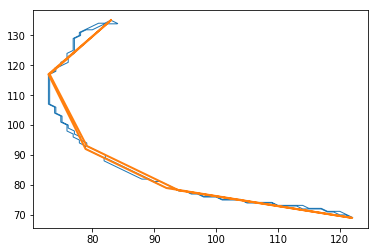

corners 9
213 contours
7 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5


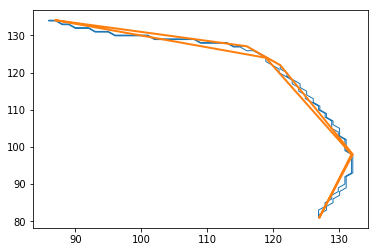

corners 8
image 63
329 contours
11 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9


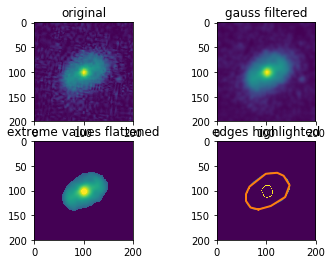

corners 12
321 contours
11 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9


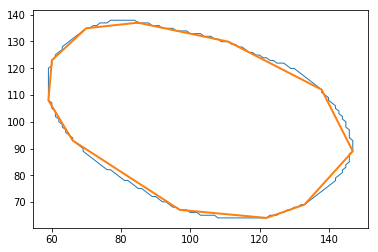

corners 12
103 contours
6 angles
angle 0
angle 1
angle 2
angle 3
angle 4


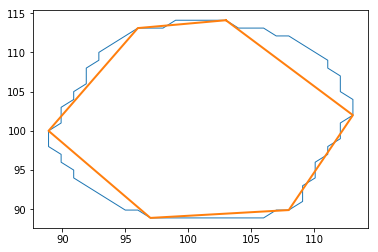

corners 7
91 contours
8 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6


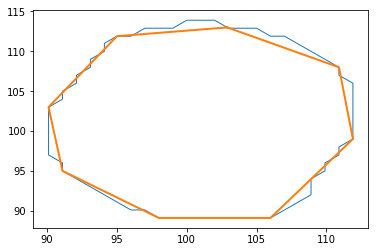

corners 9
image 64
369 contours
10 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8


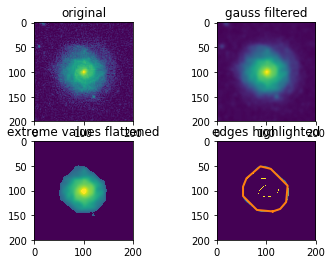

corners 11
361 contours
11 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9


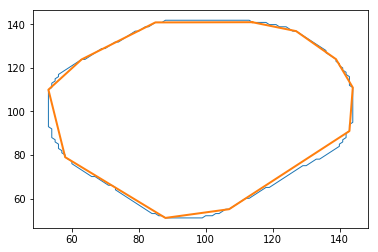

corners 12
53 contours
3 angles
angle 0
angle 1


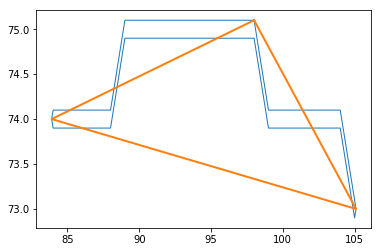

corners 4
73 contours
4 angles
angle 0
angle 1
angle 2


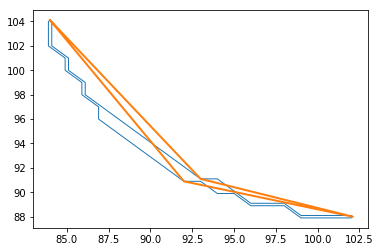

corners 5
41 contours
2 angles
angle 0


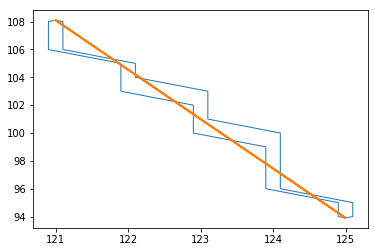

corners 3
53 contours
3 angles
angle 0
angle 1


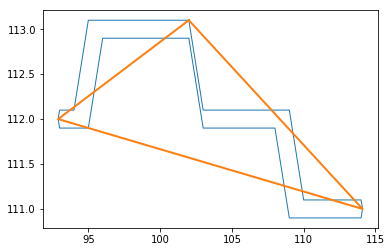

corners 4
image 65
351 contours
10 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8


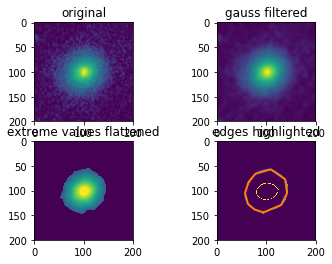

corners 11
343 contours
11 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9


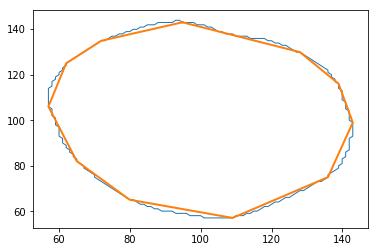

corners 12
165 contours
8 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6


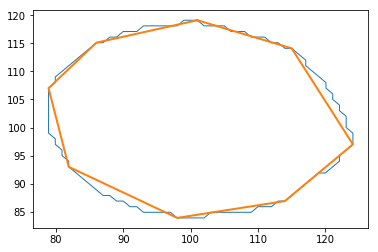

corners 9
157 contours
8 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6


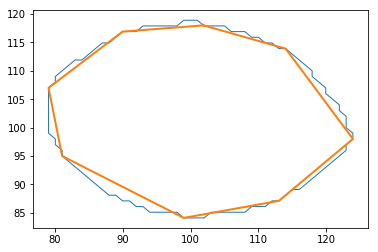

corners 9
image 66
39 contours
3 angles
angle 0
angle 1


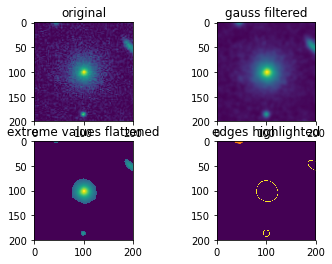

corners 4
109 contours
7 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5


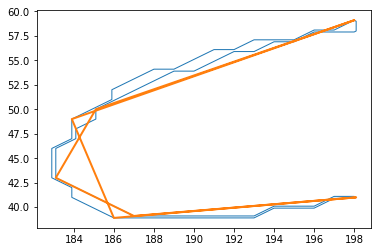

corners 8
181 contours
8 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6


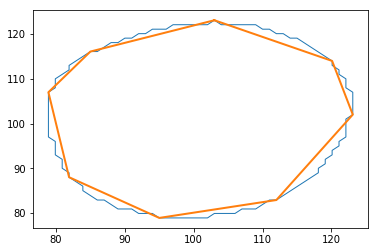

corners 9
173 contours
8 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6


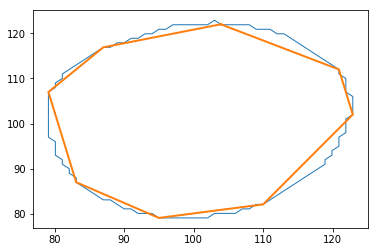

corners 9
57 contours
4 angles
angle 0
angle 1
angle 2


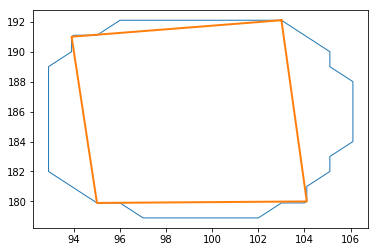

corners 5
49 contours
4 angles
angle 0
angle 1
angle 2


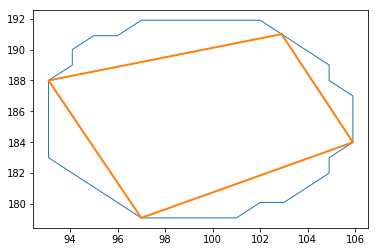

corners 5
image 67
69 contours
6 angles
angle 0
angle 1
angle 2
angle 3
angle 4


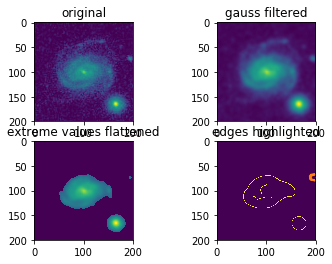

corners 7
345 contours
11 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9


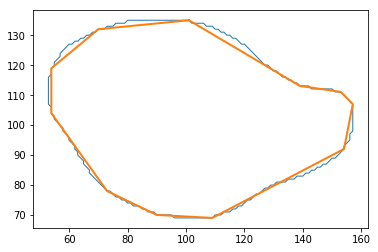

corners 12
337 contours
12 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10


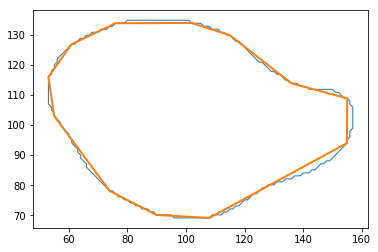

corners 13
75 contours
4 angles
angle 0
angle 1
angle 2


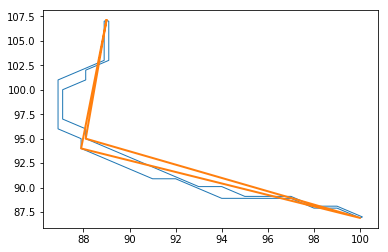

corners 5
75 contours
3 angles
angle 0
angle 1


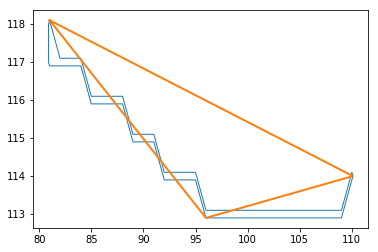

corners 4
115 contours
8 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6


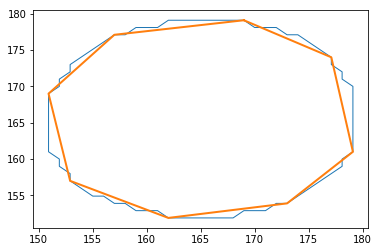

corners 9
107 contours
8 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6


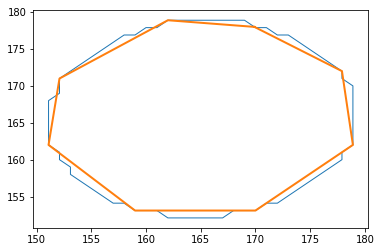

corners 9
image 68
1117 contours
34 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10
angle 11
angle 12
angle 13
angle 14
angle 15
angle 16
angle 17
angle 18
angle 19
angle 20
angle 21
angle 22
angle 23
angle 24
angle 25
angle 26
angle 27
angle 28
angle 29
angle 30
angle 31
angle 32


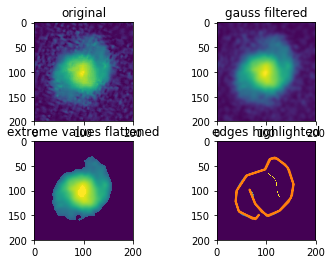

corners 35
137 contours
4 angles
angle 0
angle 1
angle 2


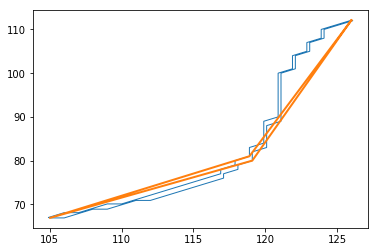

corners 5
image 69
417 contours
11 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9


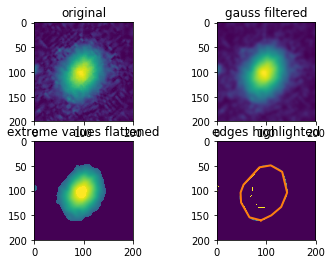

corners 12
409 contours
12 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10


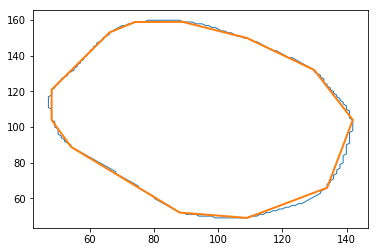

corners 13
47 contours
3 angles
angle 0
angle 1


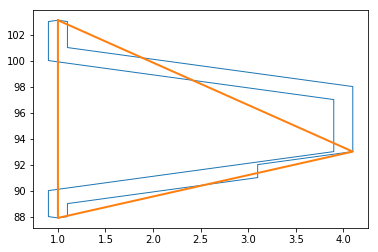

corners 4
57 contours
2 angles
angle 0


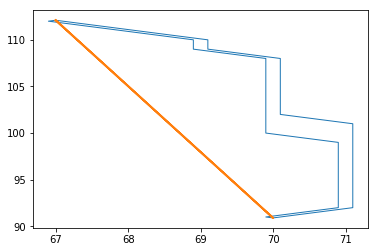

corners 3
35 contours
2 angles
angle 0


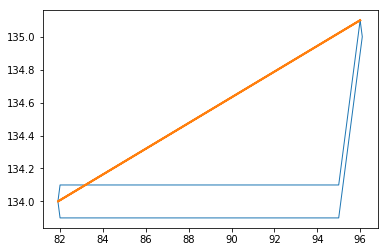

corners 3
image 70
289 contours
9 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7


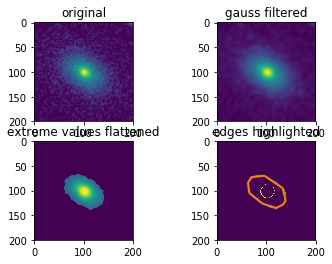

corners 10
281 contours
11 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9


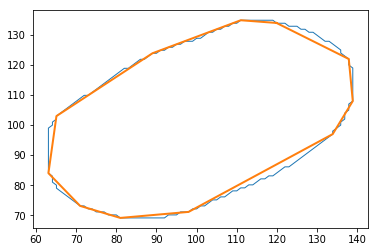

corners 12
195 contours
12 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10


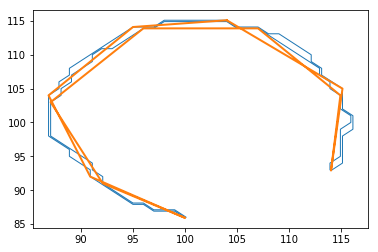

corners 13
image 71
83 contours
6 angles
angle 0
angle 1
angle 2
angle 3
angle 4


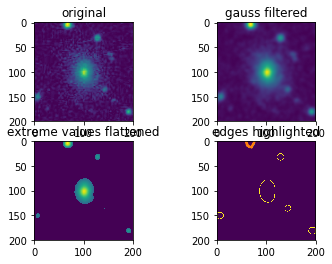

corners 7
61 contours
4 angles
angle 0
angle 1
angle 2


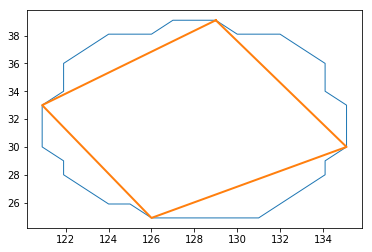

corners 5
53 contours
4 angles
angle 0
angle 1
angle 2


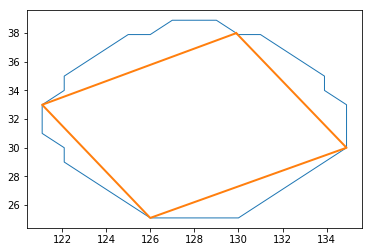

corners 5
163 contours
8 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6


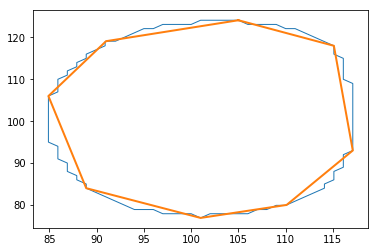

corners 9
153 contours
8 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6


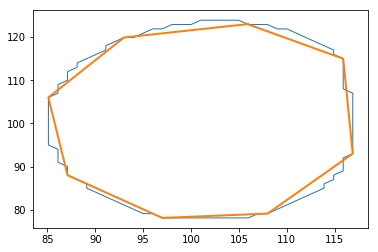

corners 9
55 contours
4 angles
angle 0
angle 1
angle 2


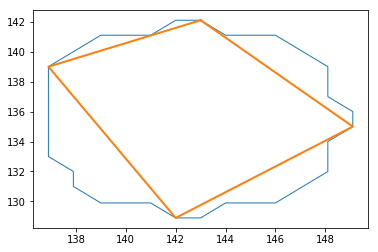

corners 5
47 contours
4 angles
angle 0
angle 1
angle 2


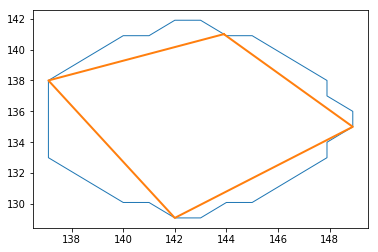

corners 5
83 contours
7 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5


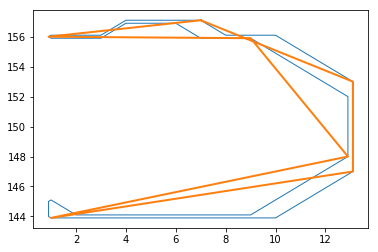

corners 8
59 contours
4 angles
angle 0
angle 1
angle 2


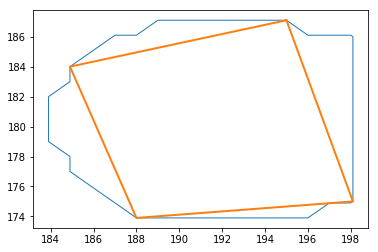

corners 5
51 contours
4 angles
angle 0
angle 1
angle 2


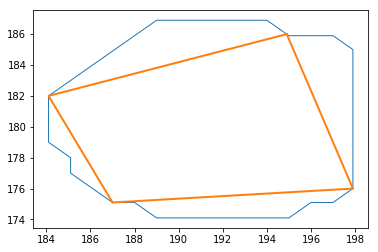

corners 5
image 72
323 contours
10 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8


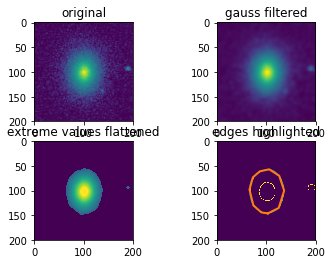

corners 11
315 contours
11 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9


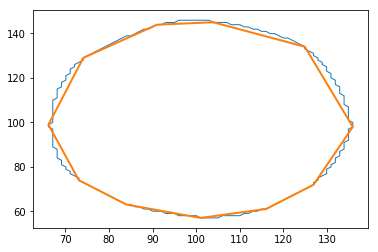

corners 12
147 contours
8 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6


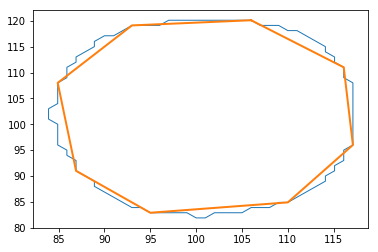

corners 9
139 contours
8 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6


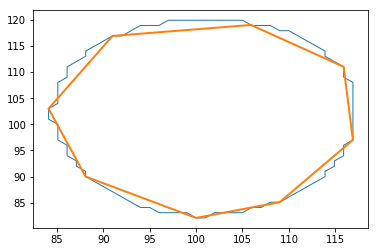

corners 9
57 contours
4 angles
angle 0
angle 1
angle 2


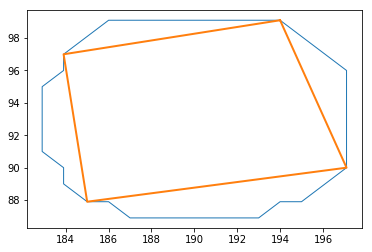

corners 5
49 contours
4 angles
angle 0
angle 1
angle 2


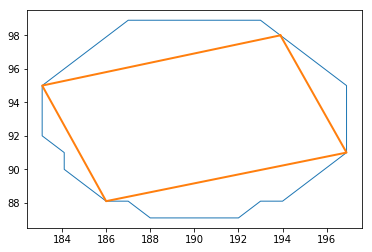

corners 5
image 73
337 contours
11 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9


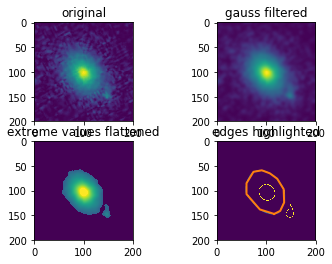

corners 12
329 contours
10 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8


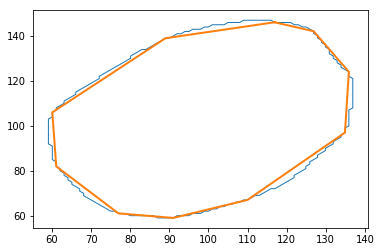

corners 11
139 contours
8 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6


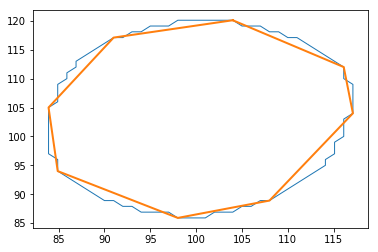

corners 9
131 contours
8 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6


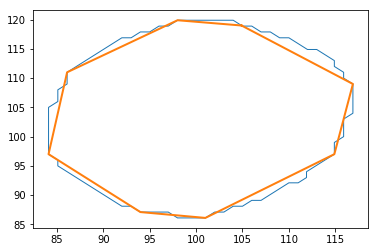

corners 9
151 contours
9 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7


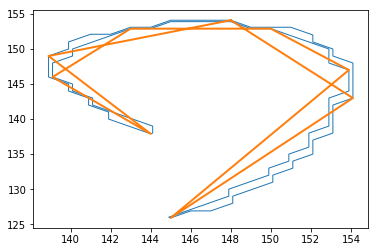

corners 10
image 74
401 contours
12 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10


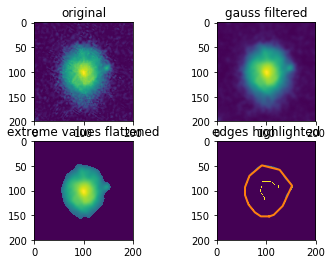

corners 13
393 contours
11 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9


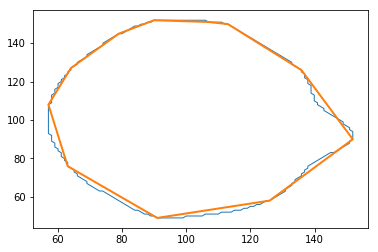

corners 12
79 contours
4 angles
angle 0
angle 1
angle 2


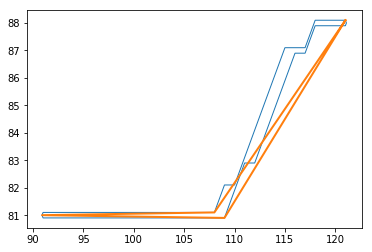

corners 5
33 contours
2 angles
angle 0


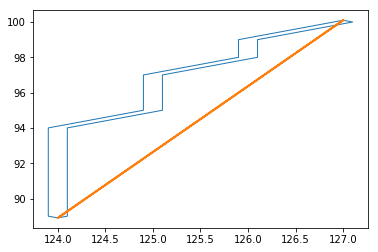

corners 3
81 contours
4 angles
angle 0
angle 1
angle 2


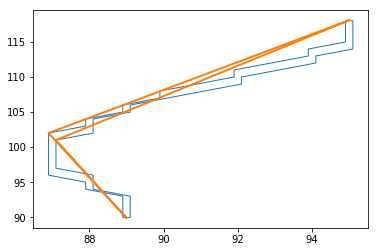

corners 5
image 75
379 contours
10 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8


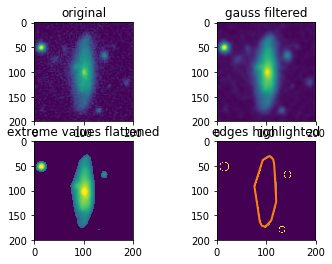

corners 11
371 contours
9 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7


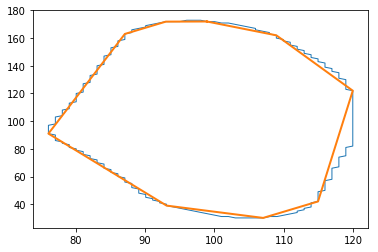

corners 10
75 contours
6 angles
angle 0
angle 1
angle 2
angle 3
angle 4


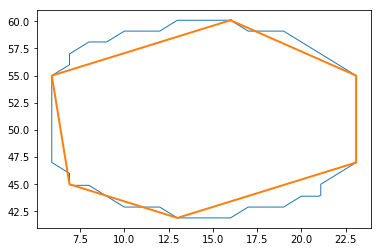

corners 7
67 contours
5 angles
angle 0
angle 1
angle 2
angle 3


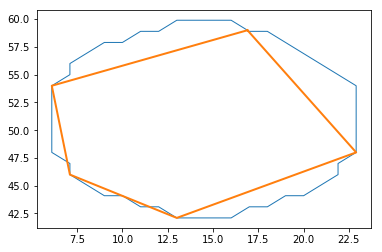

corners 6
61 contours
4 angles
angle 0
angle 1
angle 2


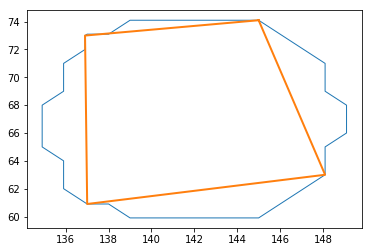

corners 5
53 contours
5 angles
angle 0
angle 1
angle 2
angle 3


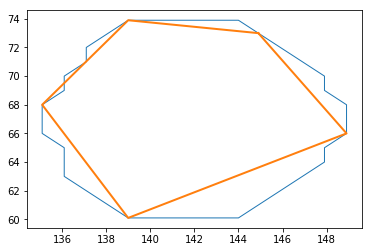

corners 6
53 contours
4 angles
angle 0
angle 1
angle 2


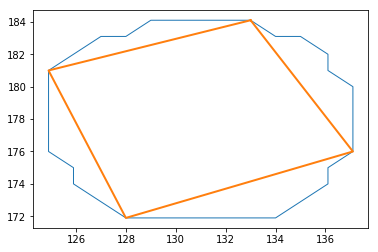

corners 5
45 contours
4 angles
angle 0
angle 1
angle 2


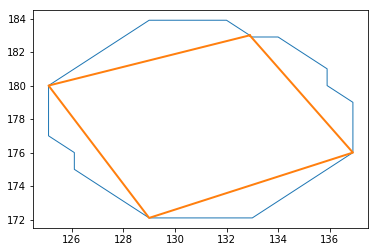

corners 5
image 76
73 contours
5 angles
angle 0
angle 1
angle 2
angle 3


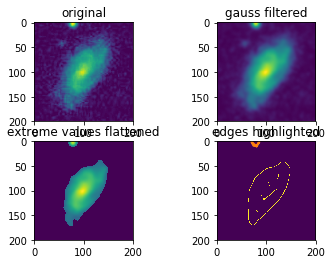

corners 6
429 contours
12 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10


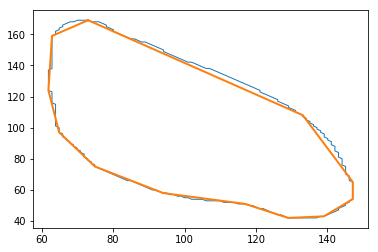

corners 13
421 contours
11 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9


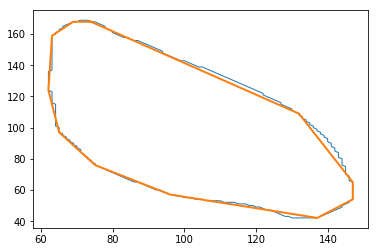

corners 12
31 contours
2 angles
angle 0


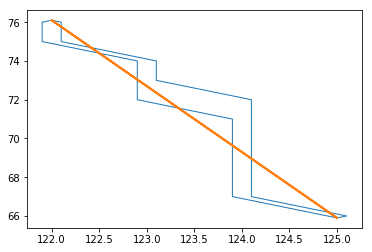

corners 3
31 contours
3 angles
angle 0
angle 1


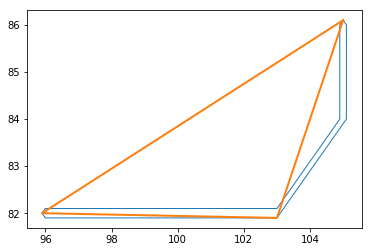

corners 4
119 contours
5 angles
angle 0
angle 1
angle 2
angle 3


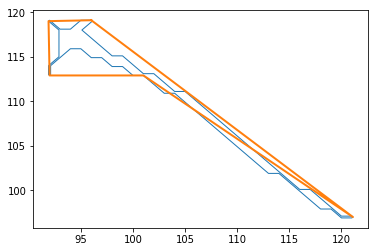

corners 6
image 77
373 contours
9 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7


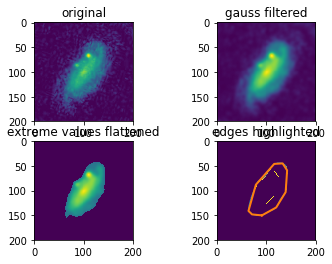

corners 10
365 contours
12 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10


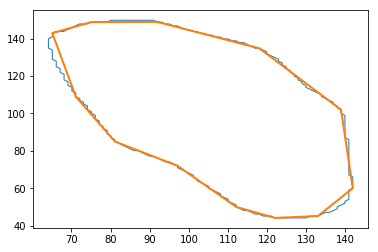

corners 13
47 contours
2 angles
angle 0


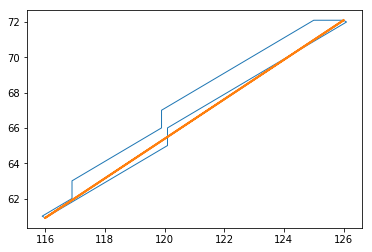

corners 3
75 contours
2 angles
angle 0


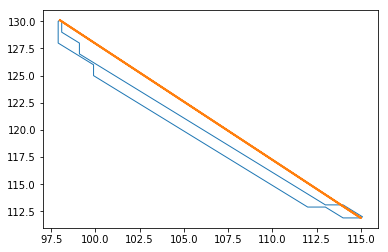

corners 3
image 78
999 contours
35 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10
angle 11
angle 12
angle 13
angle 14
angle 15
angle 16
angle 17
angle 18
angle 19
angle 20
angle 21
angle 22
angle 23
angle 24
angle 25
angle 26
angle 27
angle 28
angle 29
angle 30
angle 31
angle 32
angle 33


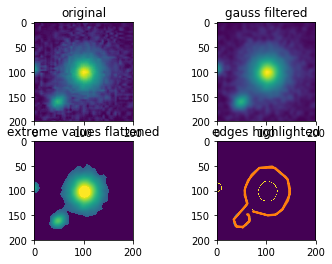

corners 36
167 contours
8 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6


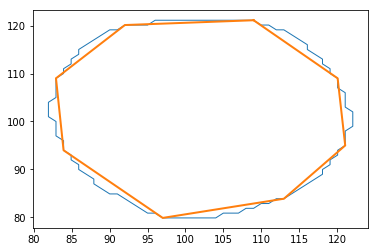

corners 9
159 contours
8 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6


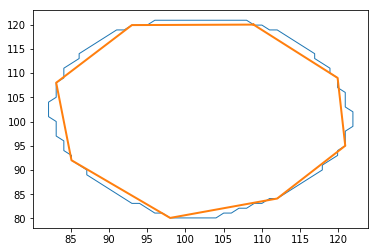

corners 9
77 contours
6 angles
angle 0
angle 1
angle 2
angle 3
angle 4


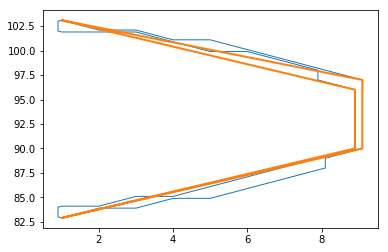

corners 7
image 79
309 contours
10 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8


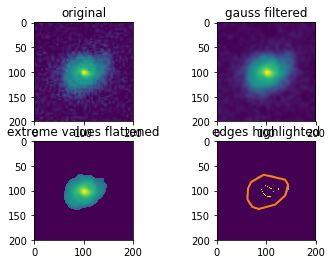

corners 11
301 contours
10 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8


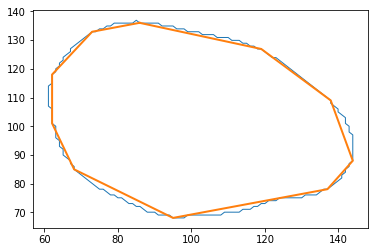

corners 11
75 contours
3 angles
angle 0
angle 1


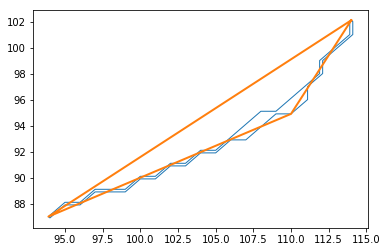

corners 4
67 contours
4 angles
angle 0
angle 1
angle 2


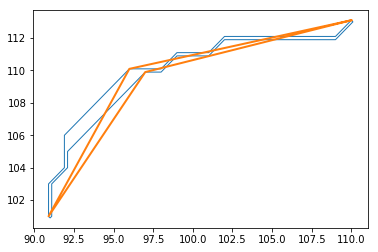

corners 5
image 80
383 contours
9 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7


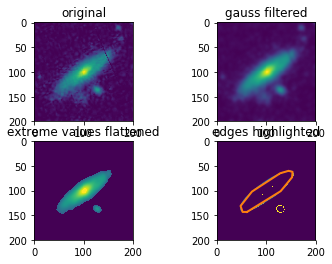

corners 10
375 contours
9 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7


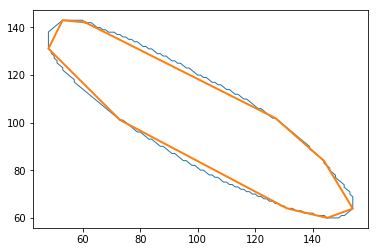

corners 10
65 contours
5 angles
angle 0
angle 1
angle 2
angle 3


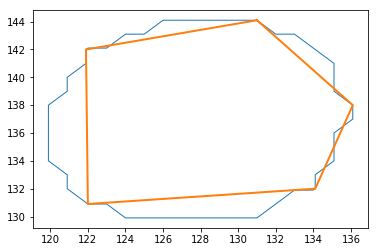

corners 6
57 contours
4 angles
angle 0
angle 1
angle 2


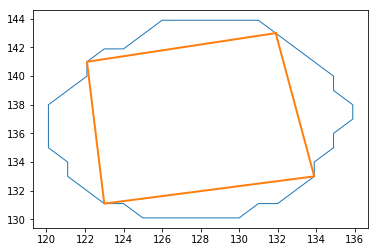

corners 5
image 81
99 contours
8 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6


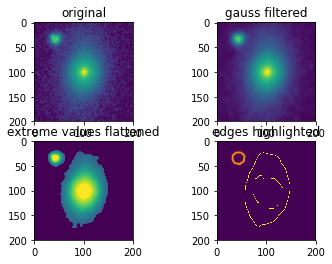

corners 9
957 contours
23 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10
angle 11
angle 12
angle 13
angle 14
angle 15
angle 16
angle 17
angle 18
angle 19
angle 20
angle 21


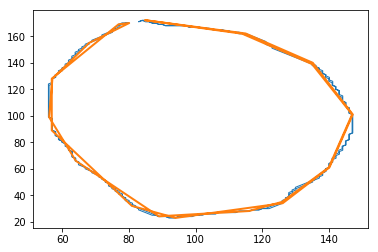

corners 24
91 contours
8 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6


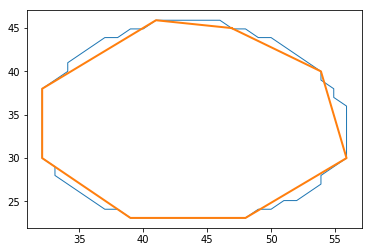

corners 9
47 contours
2 angles
angle 0


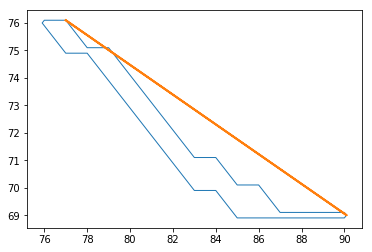

corners 3
89 contours
4 angles
angle 0
angle 1
angle 2


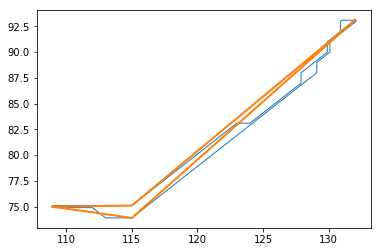

corners 5
97 contours
4 angles
angle 0
angle 1
angle 2


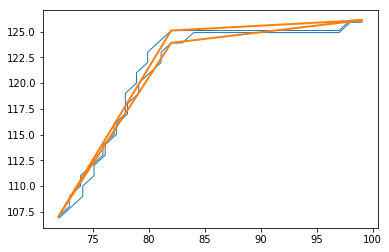

corners 5
45 contours
3 angles
angle 0
angle 1


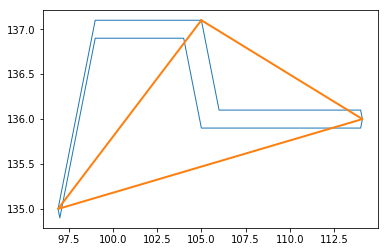

corners 4
image 82
421 contours
11 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9


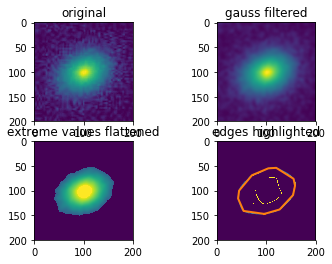

corners 12
413 contours
13 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10
angle 11


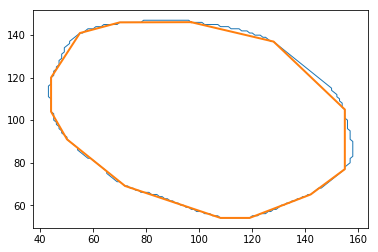

corners 14
131 contours
4 angles
angle 0
angle 1
angle 2


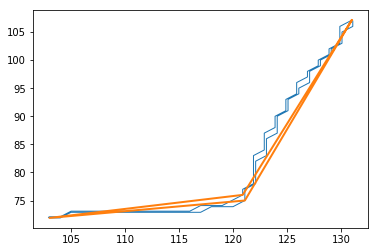

corners 5
185 contours
7 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5


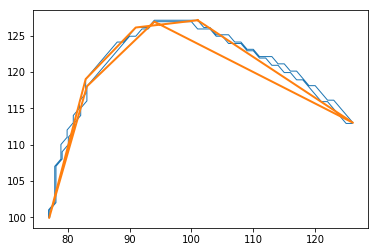

corners 8
image 83
743 contours
20 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10
angle 11
angle 12
angle 13
angle 14
angle 15
angle 16
angle 17
angle 18


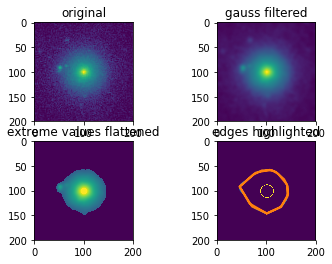

corners 21
113 contours
8 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6


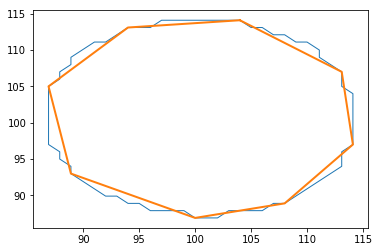

corners 9
105 contours
7 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5


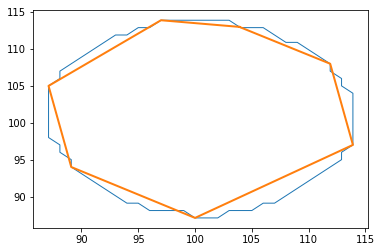

corners 8
image 84
55 contours
4 angles
angle 0
angle 1
angle 2


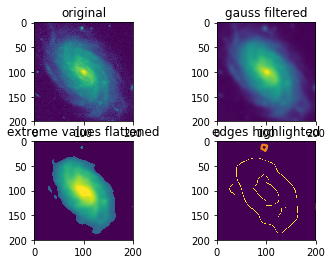

corners 5
47 contours
4 angles
angle 0
angle 1
angle 2


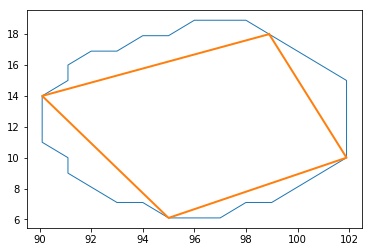

corners 5
555 contours
14 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10
angle 11
angle 12


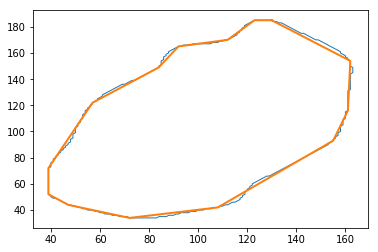

corners 15
547 contours
16 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10
angle 11
angle 12
angle 13
angle 14


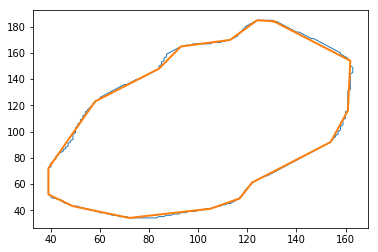

corners 17
83 contours
4 angles
angle 0
angle 1
angle 2


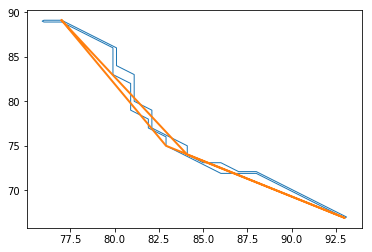

corners 5
203 contours
9 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7


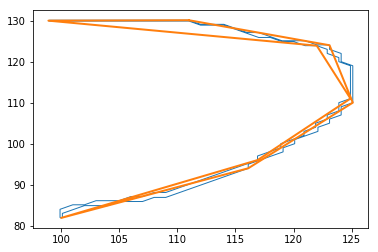

corners 10
81 contours
4 angles
angle 0
angle 1
angle 2


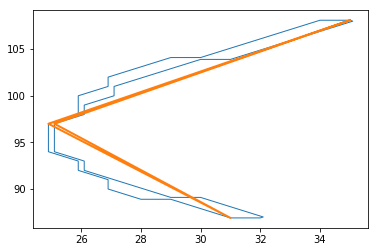

corners 5
119 contours
2 angles
angle 0


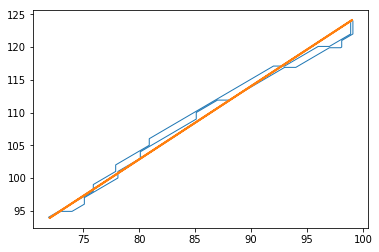

corners 3
31 contours
2 angles
angle 0


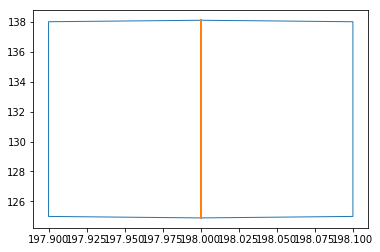

corners 3
51 contours
2 angles
angle 0


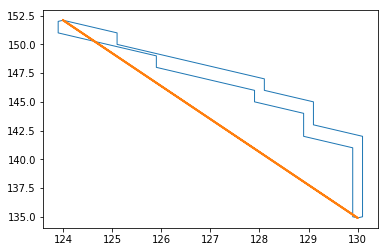

corners 3
image 85
367 contours
9 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7


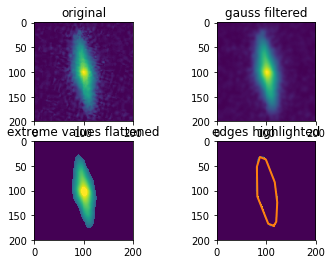

corners 10
359 contours
10 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8


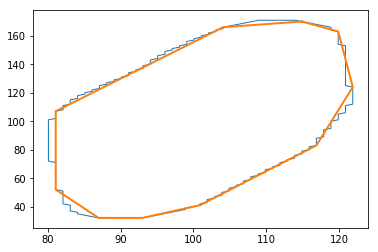

corners 11
image 86
437 contours
14 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10
angle 11
angle 12


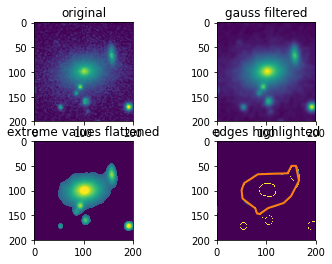

corners 15
431 contours
15 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10
angle 11
angle 12
angle 13


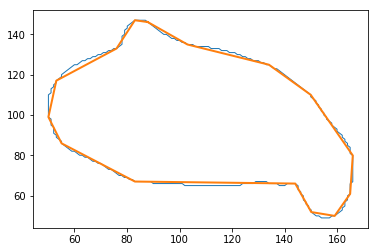

corners 16
39 contours
2 angles
angle 0


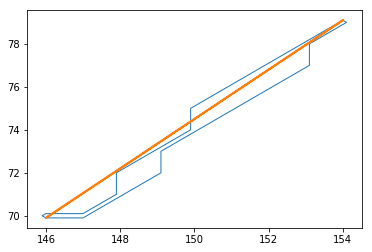

corners 3
243 contours
15 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10
angle 11
angle 12
angle 13


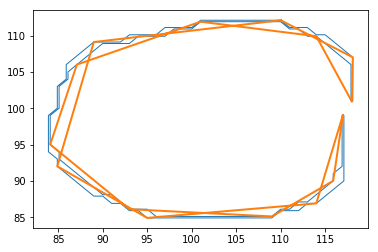

corners 16
33 contours
2 angles
angle 0


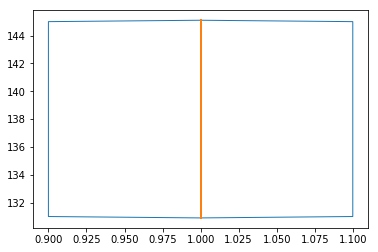

corners 3
75 contours
5 angles
angle 0
angle 1
angle 2
angle 3


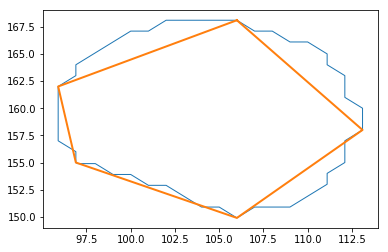

corners 6
65 contours
4 angles
angle 0
angle 1
angle 2


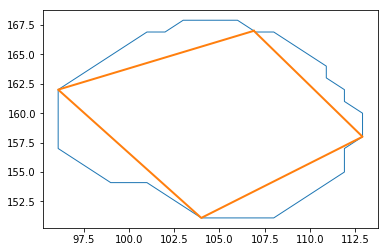

corners 5
101 contours
7 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5


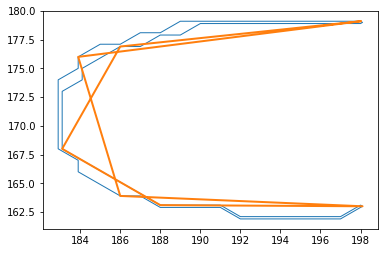

corners 8
61 contours
4 angles
angle 0
angle 1
angle 2


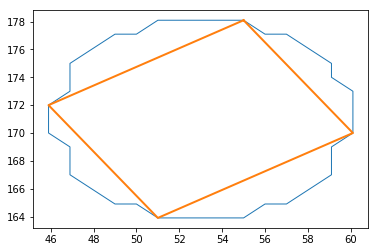

corners 5
53 contours
5 angles
angle 0
angle 1
angle 2
angle 3


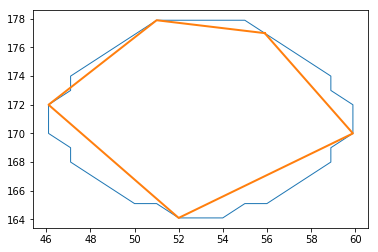

corners 6
image 87
57 contours
4 angles
angle 0
angle 1
angle 2


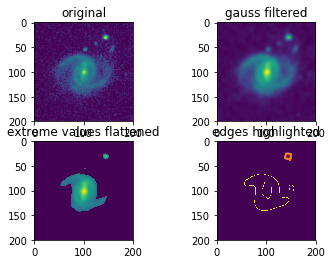

corners 5
49 contours
4 angles
angle 0
angle 1
angle 2


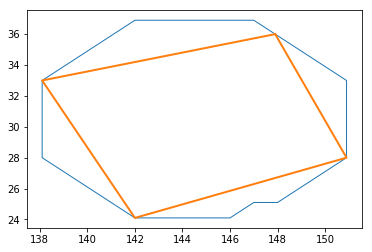

corners 5
675 contours
26 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10
angle 11
angle 12
angle 13
angle 14
angle 15
angle 16
angle 17
angle 18
angle 19
angle 20
angle 21
angle 22
angle 23
angle 24


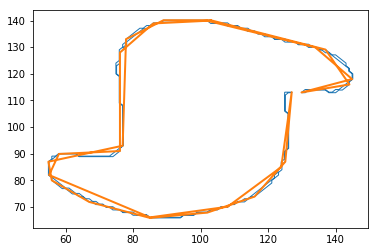

corners 27
45 contours
2 angles
angle 0


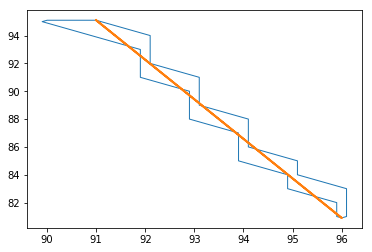

corners 3
57 contours
4 angles
angle 0
angle 1
angle 2


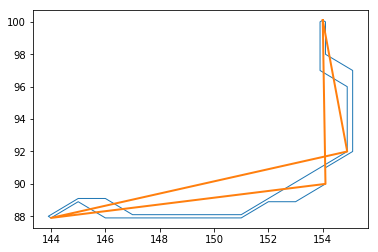

corners 5
71 contours
4 angles
angle 0
angle 1
angle 2


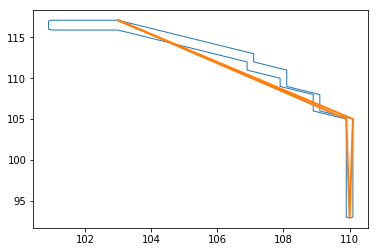

corners 5
31 contours
2 angles
angle 0


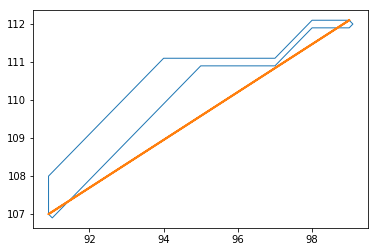

corners 3
image 88
179 contours
7 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5


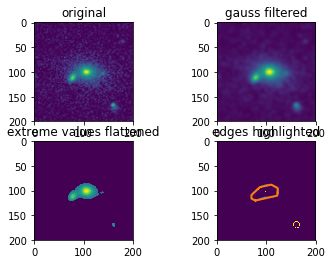

corners 8
171 contours
7 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5


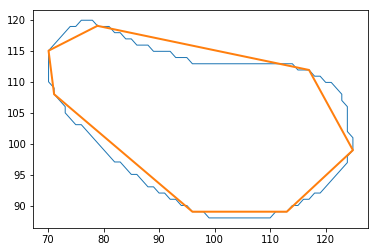

corners 8
55 contours
4 angles
angle 0
angle 1
angle 2


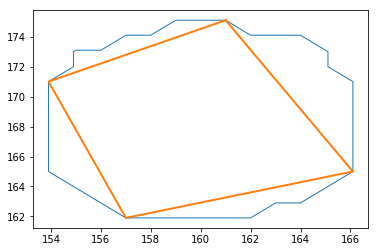

corners 5
47 contours
4 angles
angle 0
angle 1
angle 2


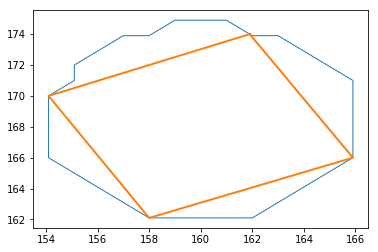

corners 5
image 89
53 contours
4 angles
angle 0
angle 1
angle 2


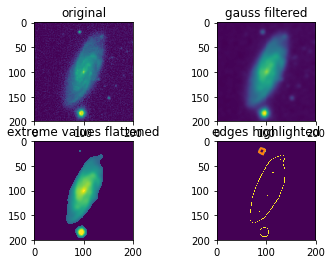

corners 5
45 contours
4 angles
angle 0
angle 1
angle 2


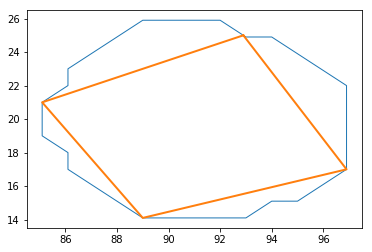

corners 5
429 contours
11 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9


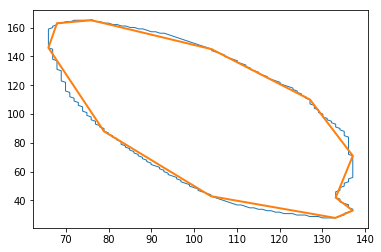

corners 12
421 contours
12 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10


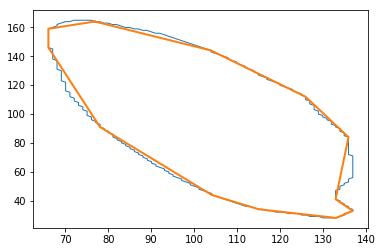

corners 13
33 contours
2 angles
angle 0


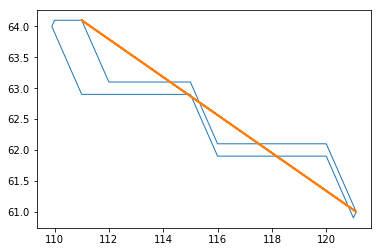

corners 3
77 contours
5 angles
angle 0
angle 1
angle 2
angle 3


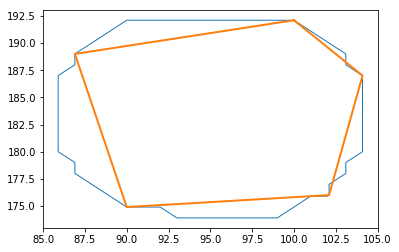

corners 6
69 contours
6 angles
angle 0
angle 1
angle 2
angle 3
angle 4


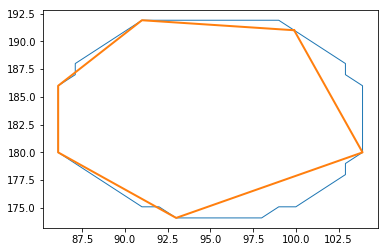

corners 7
image 90
489 contours
14 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10
angle 11
angle 12


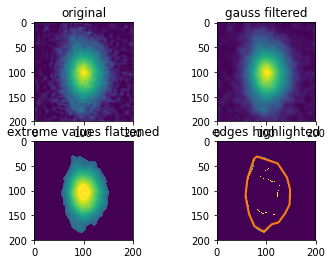

corners 15
481 contours
16 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10
angle 11
angle 12
angle 13
angle 14


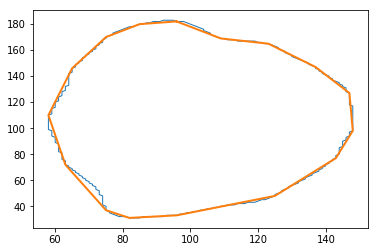

corners 17
55 contours
2 angles
angle 0


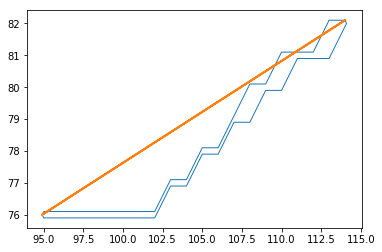

corners 3
51 contours
2 angles
angle 0


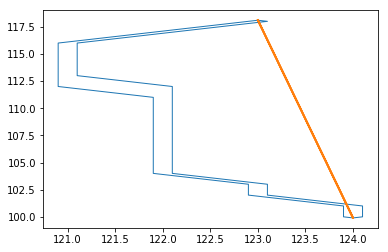

corners 3
53 contours
2 angles
angle 0


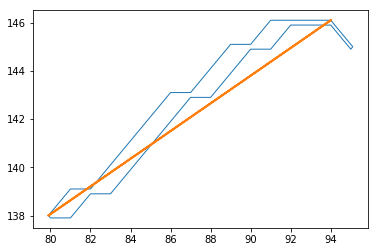

corners 3
image 91
65 contours
5 angles
angle 0
angle 1
angle 2
angle 3


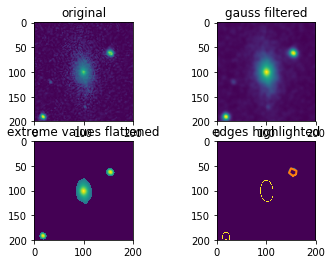

corners 6
57 contours
4 angles
angle 0
angle 1
angle 2


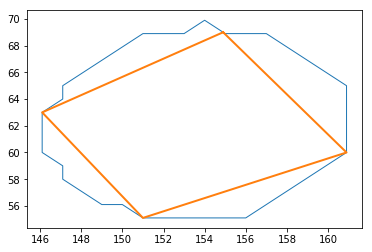

corners 5
143 contours
8 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6


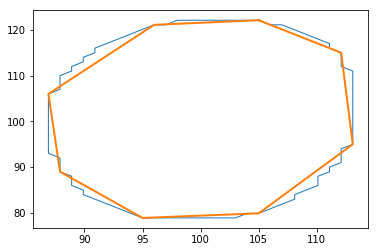

corners 9
135 contours
8 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6


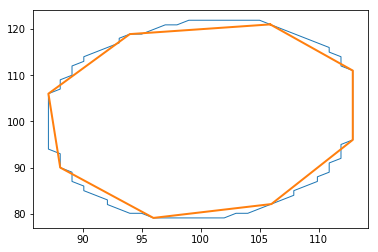

corners 9
93 contours
6 angles
angle 0
angle 1
angle 2
angle 3
angle 4


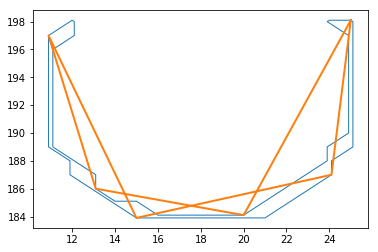

corners 7
image 92
451 contours
11 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9


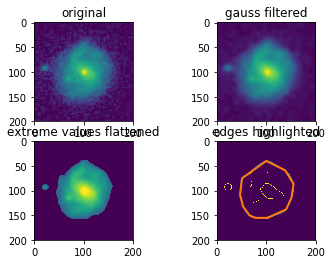

corners 12
443 contours
14 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10
angle 11
angle 12


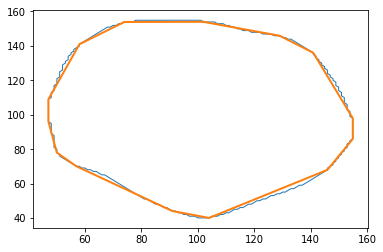

corners 15
35 contours
2 angles
angle 0


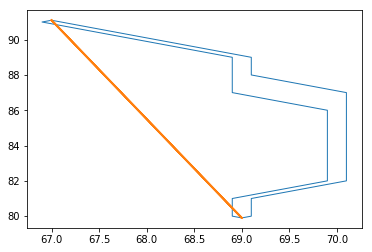

corners 3
231 contours
12 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10


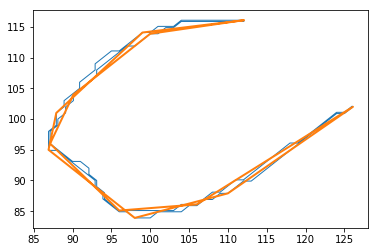

corners 13
61 contours
4 angles
angle 0
angle 1
angle 2


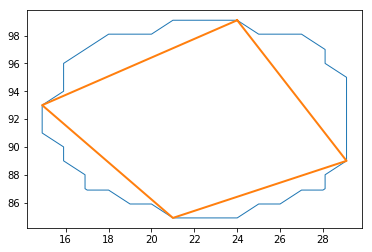

corners 5
53 contours
4 angles
angle 0
angle 1
angle 2


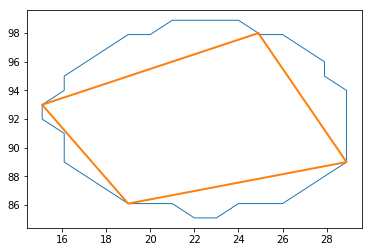

corners 5
image 93
361 contours
10 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8


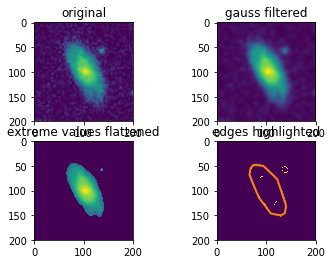

corners 11
353 contours
10 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8


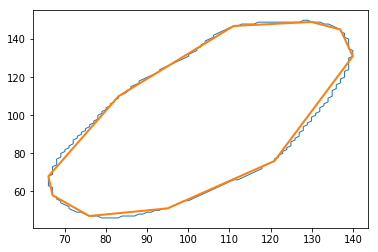

corners 11
55 contours
4 angles
angle 0
angle 1
angle 2


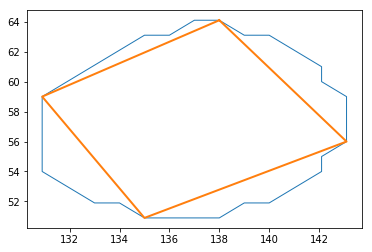

corners 5
47 contours
4 angles
angle 0
angle 1
angle 2


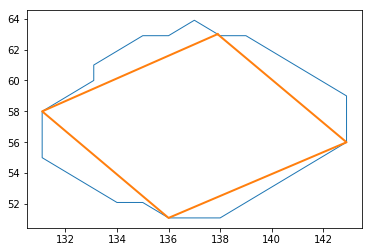

corners 5
33 contours
2 angles
angle 0


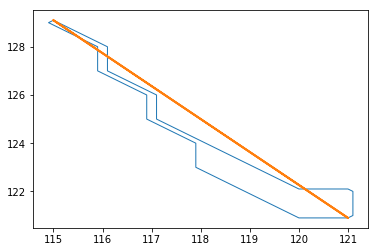

corners 3
image 94
443 contours
15 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10
angle 11
angle 12
angle 13


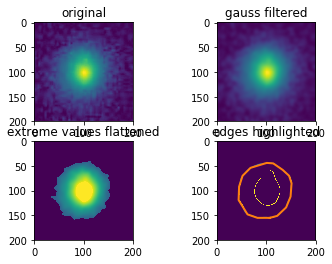

corners 16
435 contours
14 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10
angle 11
angle 12


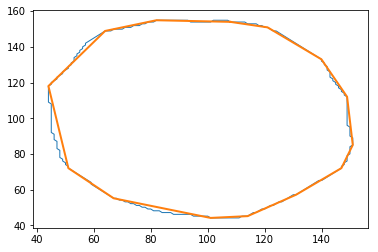

corners 15
411 contours
15 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10
angle 11
angle 12
angle 13


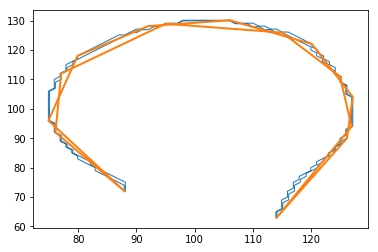

corners 16
image 95
373 contours
10 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8


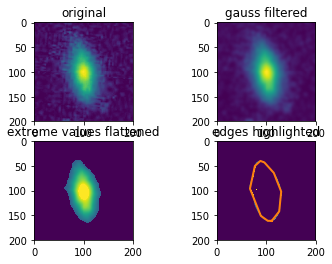

corners 11
365 contours
9 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7


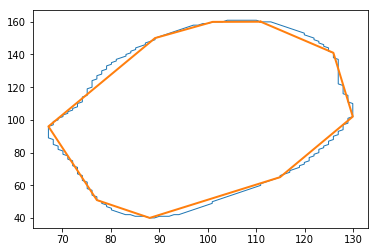

corners 10
image 96
451 contours
15 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10
angle 11
angle 12
angle 13


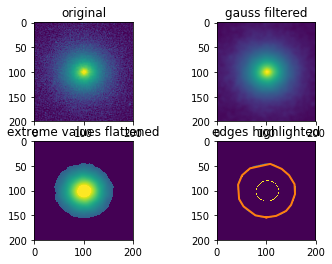

corners 16
443 contours
15 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10
angle 11
angle 12
angle 13


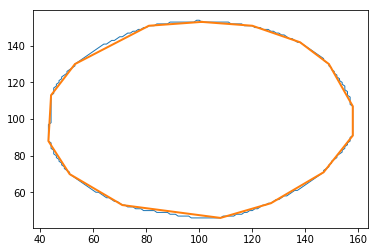

corners 16
183 contours
8 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6


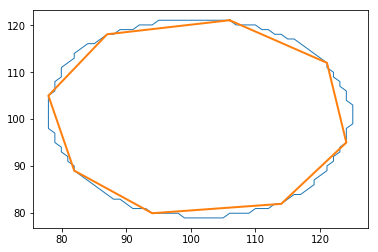

corners 9
175 contours
8 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6


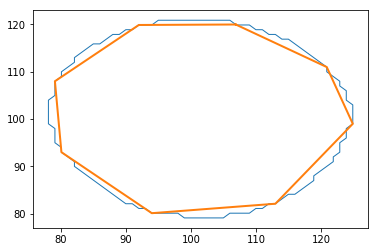

corners 9
image 97
389 contours
10 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8


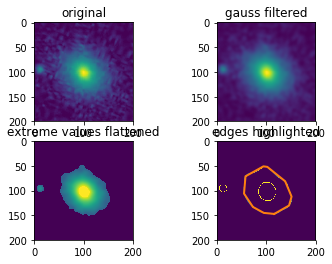

corners 11
381 contours
12 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10


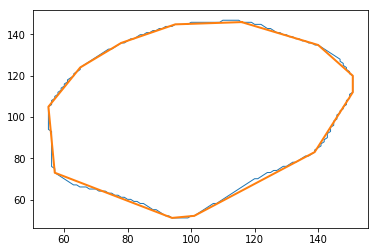

corners 13
151 contours
8 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6


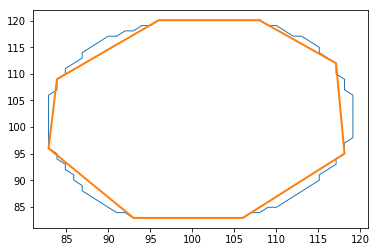

corners 9
143 contours
8 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6


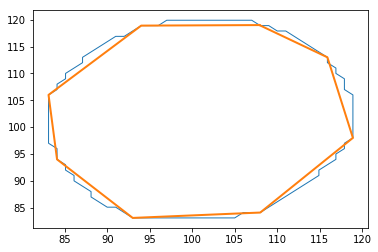

corners 9
65 contours
4 angles
angle 0
angle 1
angle 2


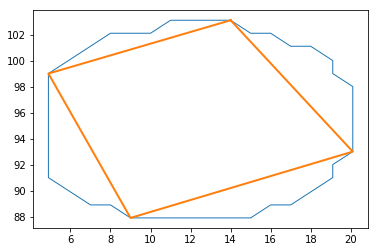

corners 5
57 contours
4 angles
angle 0
angle 1
angle 2


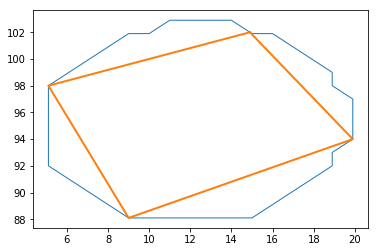

corners 5
image 98
317 contours
12 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10


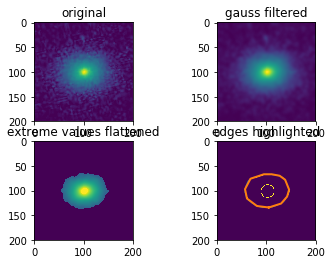

corners 13
309 contours
12 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10


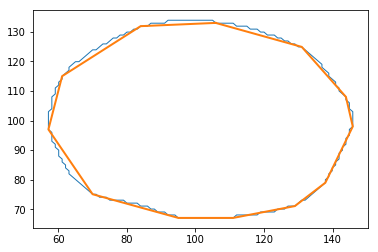

corners 13
113 contours
8 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6


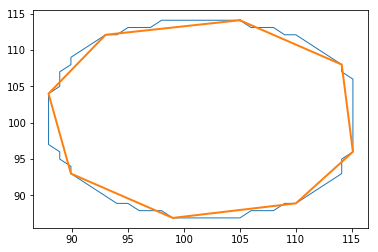

corners 9
105 contours
8 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6


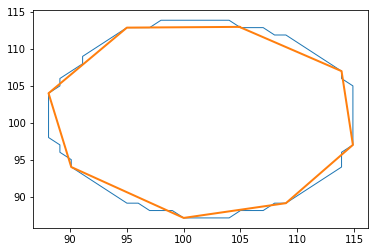

corners 9
image 99
903 contours
19 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10
angle 11
angle 12
angle 13
angle 14
angle 15
angle 16
angle 17


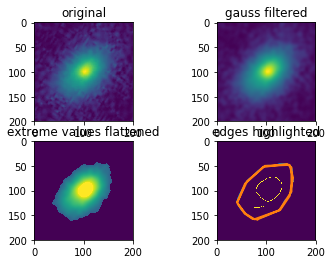

corners 20
211 contours
9 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7


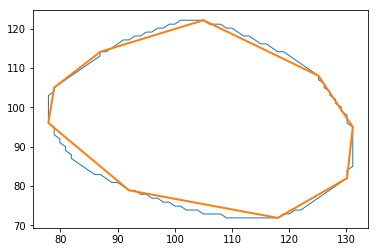

corners 10
203 contours
9 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7


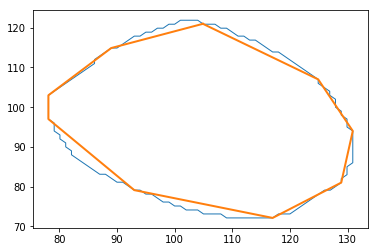

corners 10
43 contours
3 angles
angle 0
angle 1


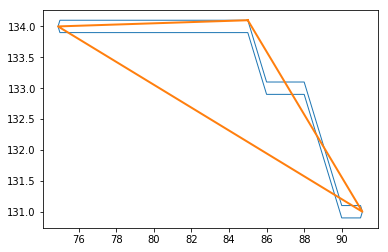

corners 4
image 100
367 contours
13 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10
angle 11


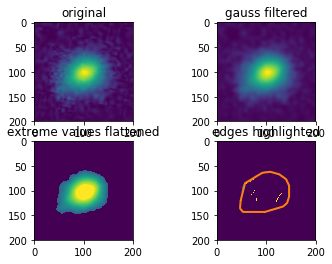

corners 14
359 contours
14 angles
angle 0
angle 1
angle 2
angle 3
angle 4
angle 5
angle 6
angle 7
angle 8
angle 9
angle 10
angle 11
angle 12


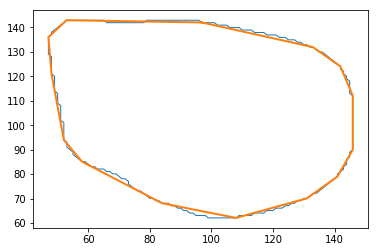

corners 15
49 contours
2 angles
angle 0


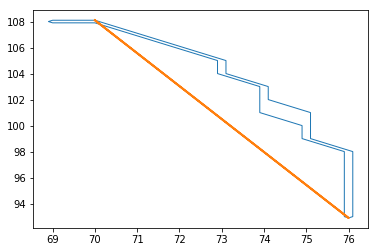

corners 3
61 contours
2 angles
angle 0


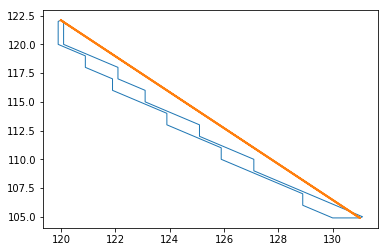

corners 3


In [84]:
def isConvex(coords):
    nbPoints = coords.shape[0]
    print(coords.shape[0]-1, "angles")

    #-2 car le premier point est aussi le dernier point du polygone
    for i in range(0, nbPoints - 2):
        print("angle", i)
        vectA = np.zeros((2,2), dtype=np.float32)
        if i == 0:
            #print("coordzero",coords[nbPoints-2], coords[0])
            vectA[0][0] = (coords[nbPoints-2][0] - coords[0][0])
            vectA[0][1] = (coords[nbPoints-2][1] - coords[0][1])
        #print("vecta00", vectA[0])
        vectA[1][0] = (coords[i][0] - coords[i+1][0])
        vectA[1][1] = (coords[i][1] - coords[i+1][0])
        #print("vecta01", vectA[1])
        #cosine_angle = np.dot(vectA[0], vectA[1]) / (np.linalg.norm(vectA[0]) * np.linalg.norm(vectA[1]))
        #d_angle = np.arccos(cosine_angle)
        #print(d_angle)
    return True



def treatImage(img):
    
    #image originale
    f = plt.figure()
    ax1 = f.add_subplot(221)
    ax1.title.set_text("original")
    plt.imshow(img)
    
    #application du filtre gaussien pour réduire les artefacts
    gaussfiltered = filters.gaussian(img, sigma=3.0)
    ax2= f.add_subplot(222)
    ax2.title.set_text("gauss filtered")
    plt.imshow(gaussfiltered)
    
    #enlèvement du bruit sur le fond noir
    im = np.where(np.logical_and(0<=gaussfiltered, gaussfiltered<=45), 0, gaussfiltered)
    im = np.where(np.logical_and(145<=im, im<=255), 150, im)
    ax3 = f.add_subplot(223)
    ax3.title.set_text("extreme values flattened")
    plt.imshow(im)
    
    #detection des rebords
    edges = feature.canny(im, sigma=6) #
    #edges = feature.canny(im, sigma=4.0, low_threshold=0.55, high_threshold=0.8)
    ax4= f.add_subplot(224)
    ax4.title.set_text("edges highlighted")
    plt.imshow(edges)
        
    contours = find_contours(edges, level=0.9, fully_connected="high")
 
    contours = [c for c in contours if len(c) >= 30]
    #edges2 = img_as_ubyte(edges)
    #img, contours, _ =   cv.findContours(edges2,cv2.RETR_LIST,cv2.CHAIN_APPROX_SIMPLE)
    #print(_)
    #cnt = contours[0]
    #for c in cnt:
    #    print(cv2.arcLength(cnt, True))
    
    #f.add_subplot(224)
    #plt.imshow(edges)
    
    #lengths = np.array( [arclength(line) for line in contours] )
    #print(lenghts)
    
    nbConvex = 0
    nbNonConvex = 0
    
    for cnt in contours:
        print(len(cnt), "contours")
        sprite = Image.fromarray(cnt)
        coords = approximate_polygon(cnt, tolerance=3)
        plt.plot(cnt[:, 1], cnt[:, 0], linewidth=1)
        plt.plot(coords[:,1], coords[:,0], linewidth=2)
        if (isConvex(coords)): #verifie si est convexe
            nbConvex +=1
        else:
            nbNonConvex +=1

        plt.show()
        print("corners",coords.shape[0])
        #plt.plot(corners[:,1], corners[:,0],linewidth=1)
    plt.show()

#mise en tons de gris
def grayscaleImages(matrix):
    len = matrix.shape[0]
    print("len", len)
    x_grayed = np.zeros((len, matrix[0].shape[1], matrix[0].shape[2]),dtype=np.uint8)
    for i in range(0,len):
        print("image", i+1)
        image = matrix[i].reshape( matrix[i].shape[1], matrix[i].shape[2], 3)
        imageGray = np.dot(image[...,:3], [0.299, 0.587, 0.114])
        treatImage(imageGray)
        imageGray = imageGray.reshape(1,matrix[i].shape[1], matrix[i].shape[2])
        x_grayed[i] = imageGray
        #plt.imshow(imageGray)
        #plt.show()
    return x_grayed
    
x_grayed = grayscaleImages(x_cropped)


def showImages(matrix):
    len = matrix.shape[0]
    for i in range(0,len):
        image = matrix[i].reshape(matrix[i].shape[1], matrix[i].shape[2], 3)
        image = image.astype(np.uint8)
        meanImagePrimitive(image)
        #treatImage(image)
        plt.imshow(image)
        plt.show()

#showImages(x_cropped)
